<center>
<img src="churn.png" alt="Alternative text" />
<h1 style="background-color:light yellow;font-family:monospace;font-size:300%;text-align:center">Credit Card Customers Segmentation and Churn Prediction</h1>
</center>

<a id='Table_Contents'></a>
<h1 style="background-color:#fbcc54;font-family:monospace;font-size:250%;text-align:center">Table of Contents</h1>

* [Table of Contents](#Table_Contents)
* [1. Problem Definition](#Problem_Definition)
* [2. The Approach](#Approach)
* [3. Data](#Data)
    - [1 Data Scription](#Data_Description)
    - [2 Load Libraries](#Load_Libraries)
    - [3 Read Dataset](#Read_Dataset)
    - [4 Data Quality](#Data_Quality)
    
* [4. EDA](#EDA)
    - [1 Target Label](#Target_Label)
    - [2 Univariate Analysis](#Univariate_Analysis)
        - [Numerical Features](#Numerical_Features)
        - [Categorical Features](#Categorical_Features)
    - [3 Multivariate Analysis](#Multivariate_Analysis)
        - [Correlation between Numerical Features](#corr_numerical)
        - [Correlation between Categorical Features](#corr_categorical)
        - [Correlation between Categorical and Numeric Features](#corr_categorial_numeric)
        - [Relationship between Attrition_Flag and Numeric features](#attrition_numeric)
        - [Relationship between Attrition_Flag and Categorical features](#attrition_categorical)
        - [Relationship between Attrition_Flag and Card_Category](#attrition_card_category)
        - [Different Card Category Customers behavior Analysis](#behavior_card_category)
    
* [5. Data Preprocessing](#Feature_Engineering)
    - [5.1 Change the targe to 0 or 1](#target_0_1)
    - [5.2 Change the categorical features to One hot encoding](#one_hot_encoding)
    - [5.3 Generate X and y](#Generate_X_y)
    - [5.4 Splitting the data into train/test](#splitting_train_test)
    - [5.5 Feature Selection](#feature_selection)   
* [6. Model Building](#Model_Building)
    - [6.1 Model using class weight](#model_weight)
    - [6.2 SMOTE](#SMOTE)
    - [6.3 Models using oversampled data](#model_oversampled)
    - [6.4 Neural Network with Tensorflow](#tensorflow)
* [7. Customer Segmentation](#Customer_Segmentation)
    - [7.1 Demographic Segmentation](#Demographic)
    - [7.2 Behavior Segmentation](#Behavior)
* [8. Deploy](#Deploy)
* [9. Conclusion](#Conclusion)

<a id='Problem_Definition'></a>
<h1 style="background-color:#fbcc54;font-family:monospace;font-size:250%;text-align:center">1.Problem Definition</h1>

Customer churn is a critical issue impacting enterprises and organizations, particularly in highly competitive industry like banks, i.e. customers closing their accounts and having fewer transactions/interactions over time.

customers usually offer some warning before being churned, hence churn prediction systems primarily focus on customer behavior to identify specific customers who are likely to churn out and indicate reasons for the churn. Such factors would aid marketing to develop effective retention strategies, increasing overall customer lifetime value, and assisting in growing the company’s market value.

Our task is to build a machine learning based classifer that can determine whether customers will leave or not 

<a id='Approach'></a>
<h1 style="background-color:#fbcc54;font-family:monospace;font-size:250%;text-align:center">2. Approach</h1>

<img src="approach.png" alt="Alternative text" />

<a id='Data'></a>
<h1 style="background-color:#fbcc54;font-family:monospace;font-size:250%;text-align:center">3.Data</h1>

<a id='Data_Description'></a>
<h3 style="color:blue">3.1 Data Description</h3>

Data is from an open-source dataset from Kaggle: (https://www.kaggle.com/code/thomaskonstantin/bank-churn-data-exploration-and-churn-prediction/data)

The dataset contains 10127 sample points with 21 distinct features such as CustomerId, CreditScore, Geography, Gender, Age, Tenure, Balance, etc.


- `CLIENTNUM`: Client number. Unique identifier for the customer holding the account (No effect on churn, will drop)
- `Attrition_Flag`: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer" (will change it to 1 or 0)
- `Customer_Age`:  Customer's Age in Years (older customers are less likely to close the account than younger ones)  
- `Gender`:  Gender of the account holder: M=Male, F=Female (May plays a role on churn)
- `Dependent_count`: Number of dependents (May effect on churn)   
- `Education_Level`: Educational Qualification of the account holder: Graduate, High School, Unknown, Uneducated, College(refers to a college student), Post-Graduate, Doctorate.  (May plays a role on churn)
- `Marital_Status`: Marital Status of the account holder: Married, Single, Divorced, Unknown
- `Income_Category`: Annual Income Category of the account holder: < $40K, $40K - 60K, $60K - $80K, $80K-$120K, > $120K, Unknown 
- `Card_Category`: Type of Card (Blue, Silver, Gold, Platinum).
- `Months_on_book`: Period of relationship with bank
- `Total_Relationship_Count`: Total no. of products held by the customer
- `Months_Inactive_12_mon`: No. of months inactive in the last 12 months
- `Contacts_Count_12_mon`: No. of Contacts in the last 12 months
- `Credit_Limit`: Credit Limit on the Credit Card
- `Total_Revolving_Bal`: The balance that carries over from one month to the next is the revolving balance
- `Avg_Open_To_Buy`: The amount left on the credit card to use (Average of last 12 months)
- `Total_Amt_Chng_Q4_Q1`: Ratio of the total transaction amount in 4th quarter and the total transaction amount in 1st quarter
- `Total_Trans_Amt`: Total Transaction Amount (Last 12 months)
- `Total_Trans_Ct`: Total Transaction Count (Last 12 months)
- `Total_Ct_Chng_Q4_Q1`: Ratio of the total transaction count in 4th quarter and the total transaction count in 1st quarter
- `Avg_Utilization_Ratio`: Average Card Utilization Ratio: how much of the available credit the customer spent

                    

<a id='Load_Libraries'></a>
<h3 style="color:blue">3.2 Load Libraries</h3>

In [99]:
# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd
# libaries to help with data visualization
import matplotlib.pyplot as pyplot
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as ex
import plotly.graph_objects as go
from plotly.subplots import make_subplots
# Library to split data
from sklearn.model_selection import train_test_split
# library to import to standardize the data
from sklearn.preprocessing import StandardScaler,RobustScaler
from sklearn.preprocessing import LabelEncoder,OrdinalEncoder,OneHotEncoder
from copy import deepcopy
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from scipy import stats
from scipy.stats import chi2_contingency
import phik
# Models
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier,
    BaggingClassifier,
)

#Metrics
from sklearn import metrics
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    auc,
    roc_curve,
    f1_score,
    accuracy_score,
    classification_report,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score
    
)
#SMOTE over_sampling
from imblearn.over_sampling import SMOTE

#shap
import shap


#segmentation
from sklearn.cluster import KMeans
from kmodes.kprototypes import KPrototypes
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import SilhouetteVisualizer
from sklearn.manifold import TSNE



# To supress scientific notations for a dataframe
pd.set_option("display.float_format", lambda x: "%.3f" % x)

# To supress warnings
import warnings
warnings.filterwarnings("ignore")

from collections import Counter


#tensorflow
import tensorflow as tf
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential
from sklearn.utils import class_weight

#save model
import pickle



<a id='Read_Dataset'></a>
<h3 style="color:blue">3.3 Read Dataset</h3>

In [17]:
df = pd.read_csv('BankChurners_final.csv')


In [18]:
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,...,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000


In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           9015 non-null   object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [20]:
# All missing values are in categorical features, replace missing with "Unknown"

def replace_null(x):
    if x == None:
        return "Unknown"
    else:
        return x

df['Income_Category'] = df['Income_Category'].fillna('Unknown')
df['Education_Level'] = df['Education_Level'].fillna('Unknown')
df['Marital_Status'] = df['Marital_Status'].fillna('Unknown')

In [21]:
df.head(110)
df.to_csv("BankChurners_unknown.csv",index=False)

In [22]:
df = pd.read_csv("BankChurners_unknown.csv")

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [23]:
df.shape

(10127, 21)

<a id='Data_Quality'></a>
<h3 style="color:blue">3.4 Data Quality</h3>

In [24]:
def quality_check(data):
    raw_data = pd.DataFrame({'column':[], 'dtype':[], 'is_unique':[], 'is_null':[], 'null_percentage':[]})
    for i in data.columns:
        column = i
        dtype = data[i].dtype
        is_unique = data[i].is_unique
        is_null = data[i].isnull().sum()
        null_percentage = is_null/data.shape[0]
        temp_data = pd.DataFrame({'column':[column], 'dtype':[dtype], 'is_unique':[is_unique], 'is_null':[is_null], 'null_percentage':[null_percentage]})
        raw_data = raw_data.append(temp_data)
    return raw_data
    

<h4>Missing and Duplicated Data</h4>

In [25]:
quality_check(df)

,column,dtype,is_unique,is_null,null_percentage
0,CLIENTNUM,int64,1.000,0.000,0.000
0,Attrition_Flag,object,0.000,0.000,0.000
0,Customer_Age,int64,0.000,0.000,0.000
0,Gender,object,0.000,0.000,0.000
0,Dependent_count,int64,0.000,0.000,0.000
0,Education_Level,object,0.000,0.000,0.000
0,Marital_Status,object,0.000,0.000,0.000
0,Income_Category,object,0.000,0.000,0.000
0,Card_Category,object,0.000,0.000,0.000
0,Months_on_book,int64,0.000,0.000,0.000


In [26]:
#statistical summary of the numerical columns in the data
df.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.000,739177606.334,36903783.450,708082083.000,713036770.500,717926358.000,773143533.000,828343083.000
Customer_Age,10127.000,46.326,8.017,26.000,41.000,46.000,52.000,73.000
Dependent_count,10127.000,2.346,1.299,0.000,1.000,2.000,3.000,5.000
Months_on_book,10127.000,35.928,7.986,13.000,31.000,36.000,40.000,56.000
Total_Relationship_Count,10127.000,3.813,1.554,1.000,3.000,4.000,5.000,6.000
Months_Inactive_12_mon,10127.000,2.341,1.011,0.000,2.000,2.000,3.000,6.000
Contacts_Count_12_mon,10127.000,2.455,1.106,0.000,2.000,2.000,3.000,6.000
Credit_Limit,10127.000,8631.954,9088.777,1438.300,2555.000,4549.000,11067.500,34516.000
Total_Revolving_Bal,10127.000,1162.814,814.987,0.000,359.000,1276.000,1784.000,2517.000
Avg_Open_To_Buy,10127.000,7469.140,9090.685,3.000,1324.500,3474.000,9859.000,34516.000


####  Observations:

* There are 10127 rows and 21 columns.
* All the columns have 10127 non-null values except Education Level and Marital Status.
* Education Level has 15% missing values and Marital status has 7.4% missing values, Income_Category has 11% missing values, they are filled with "Unknown"
* Don't have duplicate values

<a id='EDA'></a>
<h1 style="background-color:#fbcc54;font-family:monospace;font-size:250%;text-align:center">4. EDA</h1>


<a id='Target_Label'></a>
<h3 style="color:blue">4.1 Target Label</h3>

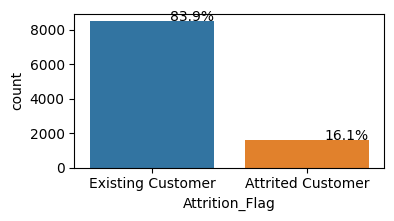

In [27]:
plt.figure(figsize=(4,2))
ax = sns.countplot(x=df['Attrition_Flag'])
total = len(df['Attrition_Flag'])
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    ax.annotate(percentage, (x, y), ha='right')
plt.show()

In [28]:
ex.pie(df,names='Attrition_Flag',title='Propotion Of Different Attrition_Flag',hole=0.33)

<a id='Univariate_Analysis'></a>
<h3 style="color:blue">4.2 Univariate Analysis</h3>


<a id='Numerical_Features'></a>
<h3>Numerical Features</h3>

In [11]:
# Creating a list of numerical columns.
numerical_cols = [
    "Customer_Age",
    "Dependent_count",
    "Months_on_book",
    "Total_Relationship_Count",
    "Months_Inactive_12_mon",
    "Contacts_Count_12_mon",
    "Credit_Limit",
    "Total_Revolving_Bal",
    "Avg_Open_To_Buy",
    "Total_Amt_Chng_Q4_Q1",
    "Total_Trans_Amt",
    "Total_Trans_Ct",
    "Total_Ct_Chng_Q4_Q1",
    "Avg_Utilization_Ratio",
]

In [12]:
df.skew()

CLIENTNUM                   0.996
Customer_Age               -0.034
Dependent_count            -0.021
Months_on_book             -0.107
Total_Relationship_Count   -0.162
Months_Inactive_12_mon      0.633
Contacts_Count_12_mon       0.011
Credit_Limit                1.667
Total_Revolving_Bal        -0.149
Avg_Open_To_Buy             1.662
Total_Amt_Chng_Q4_Q1        1.732
Total_Trans_Amt             2.041
Total_Trans_Ct              0.154
Total_Ct_Chng_Q4_Q1         2.064
Avg_Utilization_Ratio       0.718
dtype: float64

In [367]:
n = len(numerical_cols)
n

14

In [13]:
n = len(numerical_cols)
sns.set(font_scale=8) 

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10*n,5*n) )

for i in range(n):
    j = i//4
    k = i % 4
    sns.histplot(df[numerical_cols[i]],kde=True, stat='density', ax=axes[j][k])
    
    

In [18]:
#distribution
n = len(numerical_cols)
sns.set(font_scale=8) 

fig, axes = plt.subplots(nrows=n, ncols=2, figsize=(10*n,40*n) )

for i in range(n):
    sns.histplot(df[numerical_cols[i]],kde=True, stat='density', ax=axes[i][0])
    
    sns.boxplot(x=df[numerical_cols[i]], ax=axes[i][1])

####  Observations
* The Customer_Age distribution is fairly normal but slightly left-skewed.
* The Dependent_count distribution is also fairly normal but slightly left-skewed.
* The Months_on_book distribution is fairly normal but slightly left-skewed. but 85% of customer have used cards more than 27 months, the new users (less than 27 months), which means that credit card business is a mature business that it focus on keeping the customers instead of recuriting the new customers
* The Total_Relationship_Count distribution is fairly normal but slightly left-skewed.
* The Months_Inactive_12_mon distribution is right-skewed.
* The Contacts_Count_12_mon distribution is fairly normal but slightly right-skewed.
* The Credit_Limit distribution is very right-skewed.
* The Total_Revolving_Bal distribution is fairly normal but slightly left-skewed due to many customers with very low balances.
* The Avg_Open_To_Buy distribution is very right-skewed.
* The Total_Amt_Chng_Q4_Q1 distribution is very right-skewed.
* The Total_Trans_Amt distribution is very right-skewed.
* The Total_Trans_Ct distribution is fairly normal but slightly right-skewed.
* The Total_Ct_Chng_Q4_Q1 distribution is very right-skewed.
* The Avg_Utilization distribution is right-skewed.

<a id="Categorical_Features"></a>
<h3>Categorical Features</h3>

In [14]:
categorical_cols = [
    "Attrition_Flag",
    "Gender",
    "Education_Level",
    "Marital_Status",
    "Income_Category",
    "Card_Category",
]

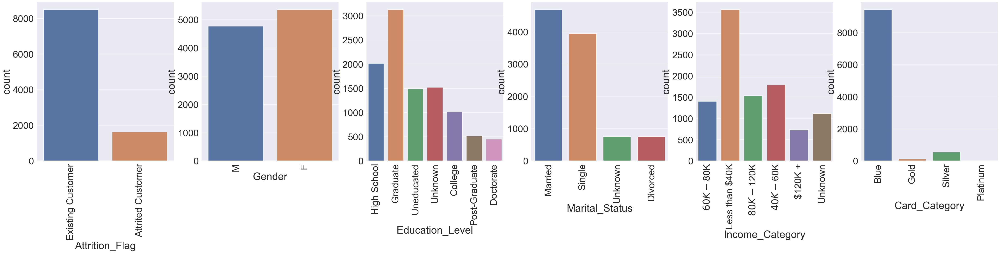

In [15]:

n = len(categorical_cols)
sns.set(font_scale=3) 

fig, axes = plt.subplots(nrows=1, ncols=n, figsize=(10*n,10) )

for i in range(n):
    axes[i].tick_params(axis="x",labelrotation=90)
    sns.countplot(x = categorical_cols[i],data=df, ax=axes[i])
    



In [29]:
ex.pie(df,names='Gender',title='Propotion Of Different Gender',hole=0.33)

In [30]:
ex.pie(df,names='Education_Level',title='Propotion Of Different Education_Level',hole=0.33)

In [31]:
ex.pie(df,names='Marital_Status',title='Propotion Of Different Marriage Statuses',hole=0.33)

In [32]:
ex.pie(df,names='Income_Category',title='Propotion Of Different Income_Category',hole=0.33)

In [33]:
ex.pie(df,names='Card_Category',title='Propotion Of Different Card_Category',hole=0.33)

####  Observations 
* **Attrition_Flag** : most of the customers is existing and then we see a much smaller number of attrited customers that closed their account.
* **Gender** : most of the customers is female, but it is not a huge difference. 
* **Education_Level** : most of the customers is Graduate. The second largest group is High-School. 
* **Marital_Status** : most customers is Married. The second largest is Single. The smallest group is those that are Divorced.
* **Income_Category** : most of the customers is less than 40K. The second largest group is the next bin up at $40K-60K. We also notice a large group of customers with an incorrect category of 'abc' that we can probably remove and treat for.  
* **Card_Category** : most of the customers is Blue. The second largest group is Silver members. If we assume that Blue is the base card then we can probably bin these categories to the 'Basic Members' and 'Premium Members'.


<a id="Multivariate_Analysis"></a>
<h3 style="color:blue">4.3 Multivariate Analysis</h3>

<a id="corr_numerical"></a>
<h3>Correlation between Numerical features</h3>

In [21]:
numerical_cols = [
    "Customer_Age",
    "Dependent_count",
    "Months_on_book",
    "Total_Relationship_Count",
    "Months_Inactive_12_mon",
    "Contacts_Count_12_mon",
    "Credit_Limit",
    "Total_Revolving_Bal",
    "Avg_Open_To_Buy",
    "Total_Amt_Chng_Q4_Q1",
    "Total_Trans_Amt",
    "Total_Trans_Ct",
    "Total_Ct_Chng_Q4_Q1",
    "Avg_Utilization_Ratio",
]

new_numerical_cols = numerical_cols + ['Attrition_Flag']

df2 =  pd.DataFrame()
df2[numerical_cols] = df[numerical_cols]
df2['Attrition_Flag'] = df['Attrition_Flag'].map({'Existing Customer':0, 'Attrited Customer':1})
df2


,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Attrition_Flag
0,45,3,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061,0
1,49,5,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105,0
2,51,3,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000,0
3,40,4,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760,0
4,40,3,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,50,2,40,3,2,3,4003.000,1851,2152.000,0.703,15476,117,0.857,0.462,0
10123,41,2,25,4,2,3,4277.000,2186,2091.000,0.804,8764,69,0.683,0.511,1
10124,44,1,36,5,3,4,5409.000,0,5409.000,0.819,10291,60,0.818,0.000,1
10125,30,2,36,4,3,3,5281.000,0,5281.000,0.535,8395,62,0.722,0.000,1


<AxesSubplot:>

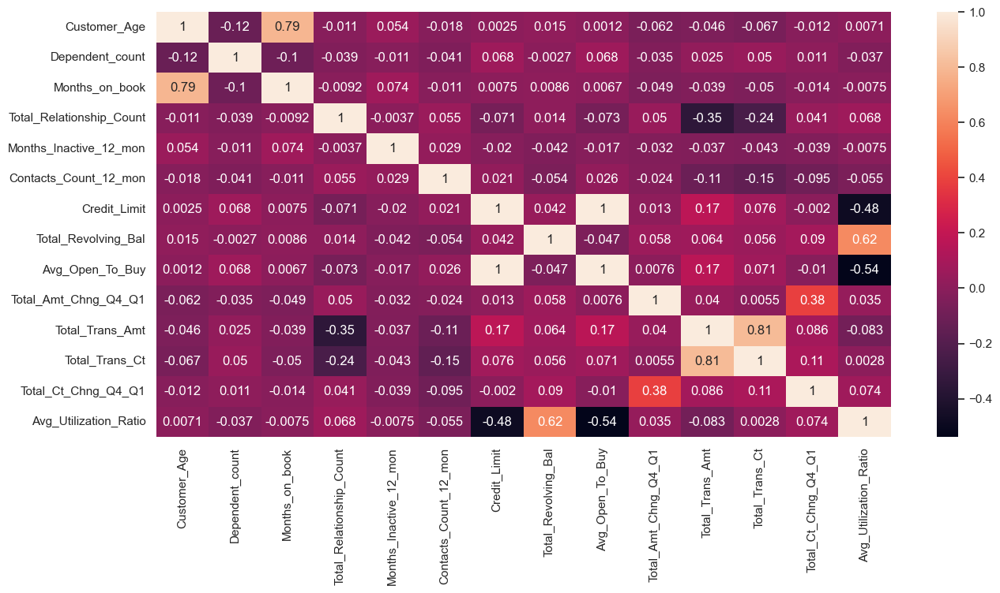

In [25]:
plt.figure(figsize=(15, 7))
sns.set(font_scale=1) 
sns.heatmap(df[numerical_cols].corr(), annot=True)

####  Observations
* We don't see many significant correlations throughout the set, except for a few noticeable exceptions.
* The most notable correlation is the direct positive correlation seen between **Credit_Limit** and **Avg_Open_To_Buy**.
* We also see very strong positive correlations between **Months_on_book** and **Customer_Age**, **Total_Trans_Amt** and **Total_Trans_Ct**, and **Total_Revolving_Bal** and **Avg_Utilization_Ratio**.
* The strongest negative correlations are seen between both **Avg_Open_To_Buy** and **Credit_Limit** with **Avg_Utilization_Ratio**.
* There are also a few other positive correlations like **Total_Ct_Chng_Q4_Q1** and **Total_Amt_Chng_Q4_Q1**, and some other negative correlations; however, these are all not as strong as the previously mentioned correlations.

<a id="corr_categorical"></a>
<h3>Correlation between Categorical features (Cramer’s V ) </h3>

In [27]:
categorical_cols = [
    "Attrition_Flag",
    "Gender",
    "Education_Level",
    "Marital_Status",
    "Income_Category",
    "Card_Category",
]

In [26]:
def replaceEncoder(df):
    df['Gender'].replace('M',1,inplace = True)
    df['Gender'].replace('F',0,inplace = True)

    df['Education_Level'].replace('Unknown',0,inplace = True)
    df['Education_Level'].replace('Uneducated',1,inplace = True)
    df['Education_Level'].replace('High School',2,inplace = True)
    df['Education_Level'].replace('College',3,inplace = True)
    df['Education_Level'].replace('Graduate',4,inplace = True)
    df['Education_Level'].replace('Post-Graduate',5,inplace = True)
    df['Education_Level'].replace('Doctorate',6,inplace = True)

    df['Marital_Status'].replace('Unknown',0,inplace = True)
    df['Marital_Status'].replace('Single',1,inplace = True)
    df['Marital_Status'].replace('Married',2,inplace = True)
    df['Marital_Status'].replace('Divorced',3,inplace = True)

    df['Card_Category'].replace('Blue',0,inplace = True)
    df['Card_Category'].replace('Gold',1,inplace = True)
    df['Card_Category'].replace('Silver',2,inplace = True)
    df['Card_Category'].replace('Platinum',3,inplace = True)


    df['Income_Category'].replace('Unknown',0,inplace = True)
    df['Income_Category'].replace('Less than $40K',1,inplace = True)
    df['Income_Category'].replace('$40K - $60K',2,inplace = True)
    df['Income_Category'].replace('$60K - $80K',3,inplace = True)
    df['Income_Category'].replace('$80K - $120K',4,inplace = True)
    df['Income_Category'].replace('$120K +',5,inplace = True)

    df['Attrition_Flag'].replace('Existing Customer',0,inplace = True)
    df['Attrition_Flag'].replace('Attrited Customer',1,inplace = True)
    
    return df

In [28]:
df3 = pd.DataFrame()
df3[categorical_cols] = df[categorical_cols]

df3 = replaceEncoder(df3)
df3

,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Card_Category
0,0,1,2,2,3,0
1,0,0,4,1,1,0
2,0,1,4,2,4,0
3,0,0,2,0,1,0
4,0,1,1,2,3,0
...,...,...,...,...,...,...
10122,0,1,4,1,2,0
10123,1,1,0,3,2,0
10124,1,0,2,2,1,0
10125,1,1,4,0,2,0


In [30]:
def cal_cramers_v(v1,v2):
    crosstab = np.array(pd.crosstab(v1,v2,rownames=None,colnames=None))
    stat = chi2_contingency(crosstab)[0]

    obs = np.sum(crosstab)
    mini = min(crosstab.shape) - 1

    return stat / (obs * mini)

In [38]:
rows = []
for v1 in df3:
    col = []
    for v2 in df3:
        
        cramers = cal_cramers_v(df3[v1],df3[v2])
        col.append(cramers)
    rows.append(col)
    

cramers_results = np.array(rows)

cramerv_matrix = pd.DataFrame(cramers_results,
                              columns=df3.columns,
                              index=df3.columns)
cramerv_matrix.head()

,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Card_Category
Attrition_Flag,0.999,0.001,0.001,0.001,0.001,0.000
Gender,0.001,1.000,0.001,0.000,0.705,0.007
Education_Level,0.001,0.001,1.000,0.001,0.001,0.001
Marital_Status,0.001,0.000,0.001,1.000,0.001,0.001
Income_Category,0.001,0.705,0.001,0.001,1.000,0.003


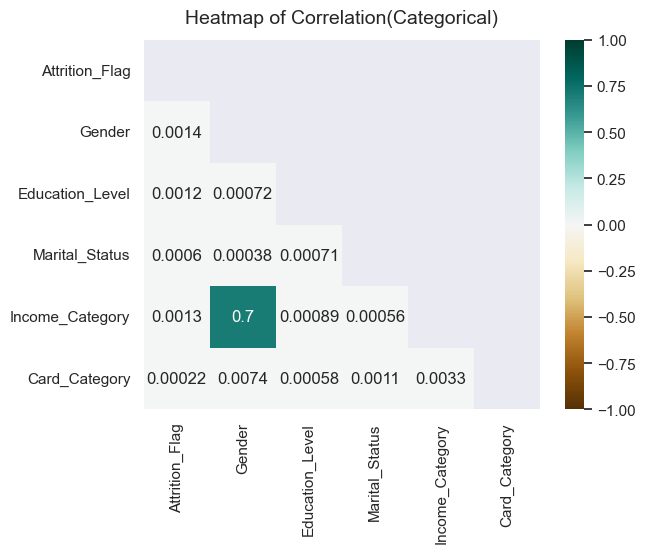

In [39]:
mask = np.triu(np.ones_like(cramerv_matrix, dtype=np.bool))
cat_heatmap = sns.heatmap(cramerv_matrix, 
                          mask=mask,
                          vmin=-1,
                          vmax=1,
                          annot=True,
                          cmap="BrBG")

cat_heatmap.set_title("Heatmap of Correlation(Categorical)", fontdict={"fontsize": 14}, pad=12)

plt.show()

####  Observations

* The most related Categorical features are: Gender, Income_Category, Education_level, but relation to "Attrition_Flag" are still very weak.

<a id="corr_categorial_numeric"></a>
<h3>Correlation between Categorical and Numeric Features (Phik) </h3>

interval columns not set, guessing: ['CLIENTNUM', 'Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']


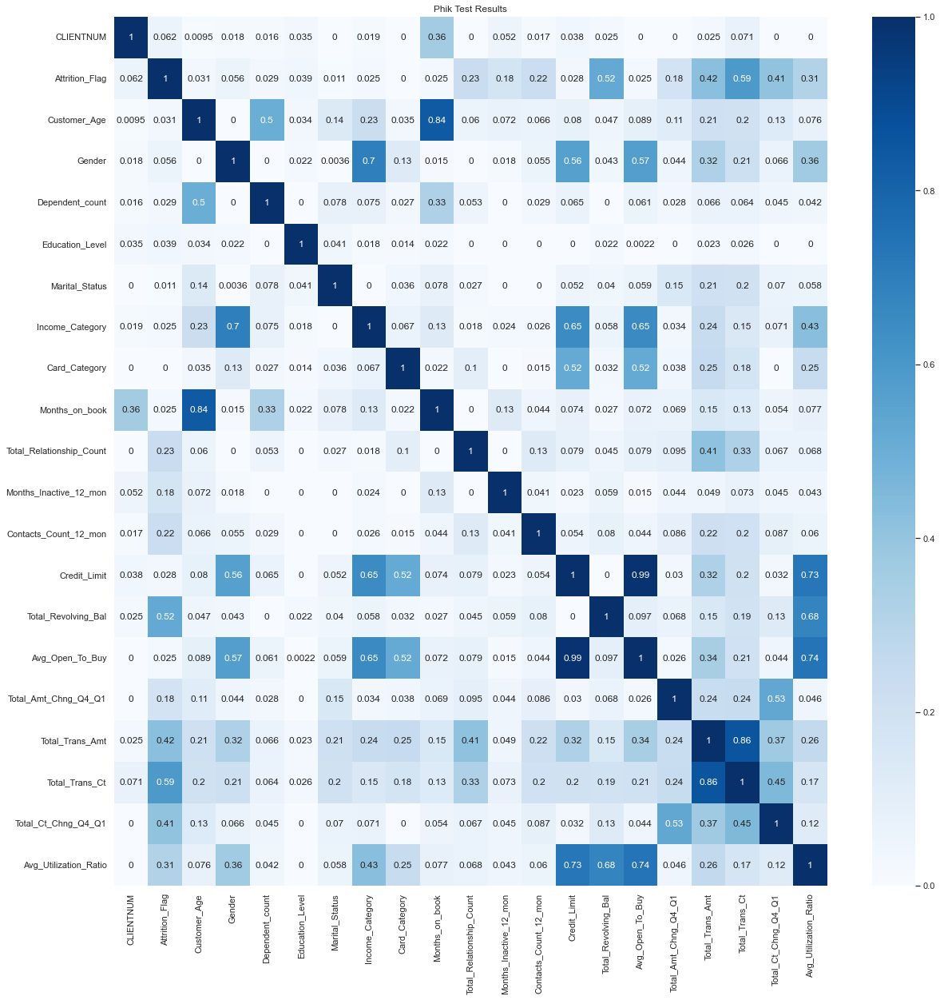

In [295]:
result = df.phik_matrix()

fig = plt.figure(figsize=(20,20))
sns.heatmap(result, annot=True, cmap='Blues')
plt.title('Phik Test Results')
plt.show()

####  Observations
* The most related Numeric features are: ***Total_Trans_Ct***, ***Total_Revolving_Bal***, ***Total_Trans_Amt***,***Total_Ct_Chng_Q4_Q1*** and ***Avg_Utilization_Ration***

* The most related Categorical features are: ***Gender***, ***Education_level***, ***Income_category***, but relation to "Attrition_Flag" are still weak.


<a id="attrition_numeric"></a>
<h3>Relationship between Attrition_Flag and Numerical features</h3>

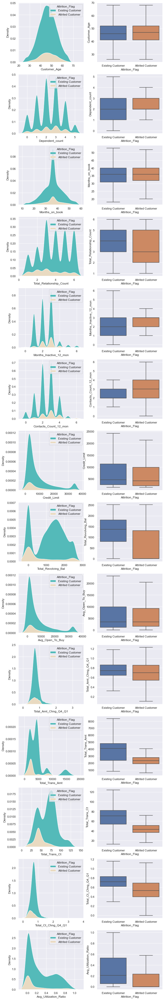

In [169]:
n = len(numerical_cols)
fig, axes = plt.subplots(nrows= n, ncols=2, figsize=(10,5*n) )

for i in range(n):
    #axes[i].tick_params(axis="x",labelrotation=90)

    sns.kdeplot(df[numerical_cols[i]], fill=True, alpha=1, hue = df['Attrition_Flag'], 
                palette=('#54BAB9', '#E9DAC1'), multiple='stack', ax=axes[i][0])
    sns.boxplot(x='Attrition_Flag', y=numerical_cols[i], data=df, showfliers=False, ax=axes[i][1])


In [159]:
df.groupby(["Attrition_Flag"])[numerical_cols].mean()

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
Attrition_Flag,,,,,,,,,,,,,,
Attrited Customer,46.659,2.403,36.178,3.280,2.693,2.972,8136.039,672.823,7463.216,0.694,3095.026,44.934,0.554,0.162
Existing Customer,46.262,2.335,35.881,3.915,2.274,2.356,8726.878,1256.604,7470.273,0.773,4654.656,68.673,0.742,0.296


####  Observations 
* The most notable difference between active and closed accounts can be seen in the means for **Total_Revolving_Bal** and **Avg_Utilization_Ratio** as the existing customers have a mean nearly double that of the attrited customers.
* There is also a significant difference between the two customer types in the **Total_Trans_Amt** and **Total_Trans_Ct** as we see the existing customers have signifcantly larger means in these two columns.

####  Futures may related to Churn
* ***Total_Revolving_Bal，Total_Trans_Amt，Total_Trans_Ct and Avg_Utilization_Ratio***, which matched the Phik heatmap

<a id="attrition_categorical"></a>
<h3>Relationship between Attrition_Flag and Categorical features</h3>

Text(0, 0.5, 'Percentage Active/Inactive %')

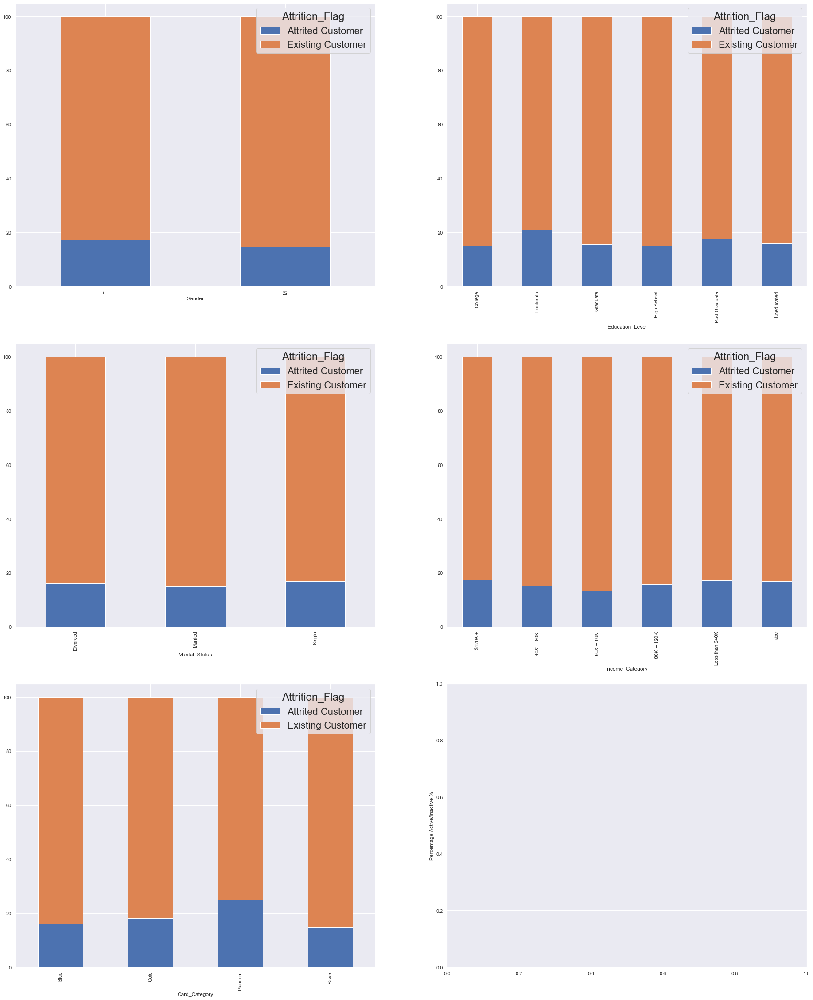

In [23]:
# Plot crosstab percentages across the categorical columns based on Attrition_Flag values
n = len(categorical_cols)
fig, axes = plt.subplots(nrows= 3, ncols=2, figsize=(32, 40) )
sns.set(font_scale=2) 
(pd.crosstab(df[categorical_cols[1]], df["Attrition_Flag"], normalize="index") * 100).plot(
            kind="bar",  stacked=True, ax=axes[0][0])
(pd.crosstab(df[categorical_cols[2]], df["Attrition_Flag"], normalize="index") * 100).plot(
            kind="bar",  stacked=True, ax=axes[0][1])
(pd.crosstab(df[categorical_cols[3]], df["Attrition_Flag"], normalize="index") * 100).plot(
            kind="bar",  stacked=True, ax=axes[1][0])
(pd.crosstab(df[categorical_cols[4]], df["Attrition_Flag"], normalize="index") * 100).plot(
            kind="bar",  stacked=True, ax=axes[1][1])
(pd.crosstab(df[categorical_cols[5]], df["Attrition_Flag"], normalize="index") * 100).plot(
            kind="bar",  stacked=True, ax=axes[2][0])

plt.ylabel("Percentage Active/Inactive %")

####  Observations 
* A slightly larger percentage of women closed their accounts.
* Customers with 'Doctorate' followed by 'Post-Graduate' Educational Qualification rate have a higher attrition rate when compared to others.

* The attrition rates are quite similar across marital statuses as well, but the single members do have a slightly higher percentage.
* The attrition rate is also similar across income bins, but those making <$40K have a slightly higher percentage than the others.
* The attrition rate across the card types is also quite similar, but unexpectedly we do see that the 'Platinum' members have the highest attrition rate and it is one of the most signifcant differences across any of the categorical columns.

<a id="attrition_card_category"></a>
<h3>Relationship between Attrition_Flag and Card_Category</h3>

In [25]:
category_churn = pd.pivot_table(df, values=['CLIENTNUM'], columns=['Attrition_Flag'], index=['Card_Category'], aggfunc='count', margins=True)

In [26]:
category_churn

CLIENTNUM                         
Attrition_Flag Attrited Customer Existing Customer    All
Card_Category                                            
Blue                        1519              7917   9436
Gold                          21                95    116
Platinum                       5                15     20
Silver                        82               473    555
All                         1627              8500  10127

In [34]:
category_churn[('CLIENTNUM', 'Attrited Customer')]

Card_Category
Blue        1519
Gold          21
Platinum       5
Silver        82
All         1627
Name: (CLIENTNUM, Attrited Customer), dtype: int64

In [58]:
category_churn[('CLIENTNUM', 'Attrited Customer')]['Platinum']

5

In [86]:
attrited_num = []
attrited_num.append(category_churn[('CLIENTNUM', 'Attrited Customer')]['Blue'])
attrited_num.append(category_churn[('CLIENTNUM', 'Attrited Customer')]['Silver'])
attrited_num.append(category_churn[('CLIENTNUM', 'Attrited Customer')]['Gold'])
attrited_num.append(category_churn[('CLIENTNUM', 'Attrited Customer')]['Platinum'])
existing_num = []
existing_num.append(category_churn[('CLIENTNUM', 'Existing Customer')]['Blue'])
existing_num.append(category_churn[('CLIENTNUM', 'Existing Customer')]['Silver'])
existing_num.append(category_churn[('CLIENTNUM', 'Existing Customer')]['Gold'])
existing_num.append(category_churn[('CLIENTNUM', 'Existing Customer')]['Platinum'])
churn_percentage = []
churn_percentage.append(100*category_churn[('CLIENTNUM', 'Attrited Customer')]['Blue']/(category_churn[('CLIENTNUM', 'Attrited Customer')]['Blue']+category_churn[('CLIENTNUM', 'Existing Customer')]['Blue']))
churn_percentage.append(100*category_churn[('CLIENTNUM', 'Attrited Customer')]['Silver']/(category_churn[('CLIENTNUM', 'Attrited Customer')]['Silver']+category_churn[('CLIENTNUM', 'Existing Customer')]['Silver']))
churn_percentage.append(100*category_churn[('CLIENTNUM', 'Attrited Customer')]['Gold']/(category_churn[('CLIENTNUM', 'Attrited Customer')]['Gold']+category_churn[('CLIENTNUM', 'Existing Customer')]['Gold']))
churn_percentage.append(100*category_churn[('CLIENTNUM', 'Attrited Customer')]['Platinum']/(category_churn[('CLIENTNUM', 'Attrited Customer')]['Platinum']+category_churn[('CLIENTNUM', 'Existing Customer')]['Platinum']))


In [87]:
category_churn_group = pd.DataFrame()
category_churn_group['Card_category'] =['Blue','Silver','Gold','Platinum']
category_churn_group['Attrited'] = attrited_num
category_churn_group['Existing'] = existing_num
category_churn_group['Churn_percentage'] = churn_percentage

In [88]:
category_churn_group

,Card_category,Attrited,Existing,Churn_percentage
0,Blue,1519,7917,16.098
1,Silver,82,473,14.775
2,Gold,21,95,18.103
3,Platinum,5,15,25.000


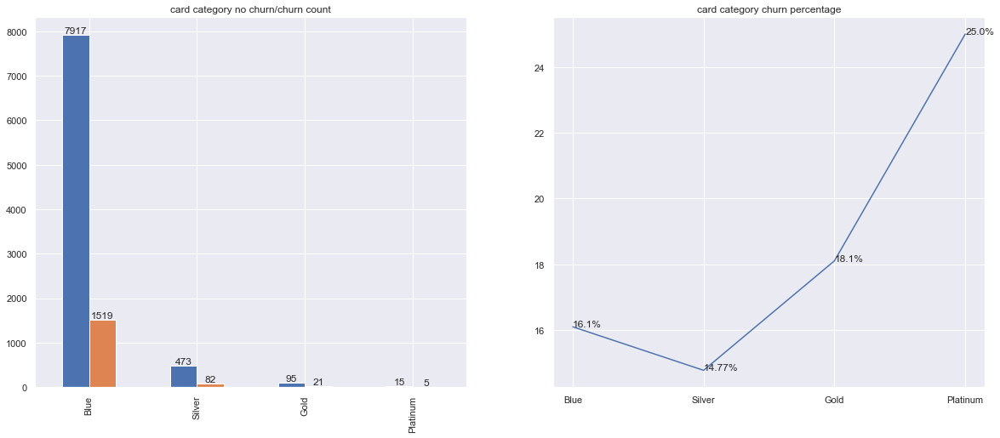

In [137]:
fig, axes = plt.subplots(nrows=1, ncols=2)

subplot = category_churn_group[['Existing','Attrited']].plot(kind='bar',ax=axes[0], title = "card category no churn/churn count", figsize=(20,8), legend=False)
for container in axes[0].containers:
    axes[0].bar_label(container)
#subplot.yaxis.set_major_formatter(PercentFormatter())

category_churn_group['Churn_percentage'].plot(kind='line',ax=axes[1], title="card category churn percentage", figsize=(20,8), legend=False)
for container in axes[1].containers:
    axes[1].line_label(container)
    
axes[0].set_xticklabels(category_churn_group['Card_category'])
axes[1].set_xticks([0,1,2,3])
axes[1].set_xticklabels(category_churn_group['Card_category'])

for i, j in zip([0,1,2,3],category_churn_group['Churn_percentage']):
    
    axes[1].annotate(str(round(j,2))+'%', xy=(i,j))

####  Observations 
* Blue, Gold and Platinum card customers churn rate is higher than average churn rate 16%. They are 16.1%, 18.1% and 25.0% respectively
* Blue card churned customers made 93% of all churned customers, which is the main reason of customer churned

<a id="behavior_card_category"></a>
<h3>Different Card Category Customers behavior analysis </h3>

In [175]:
behavior_features =['Total_Relationship_Count','Avg_Utilization_Ratio','Months_Inactive_12_mon','Contacts_Count_12_mon',
                    'Credit_Limit','Total_Revolving_Bal','Total_Trans_Amt','Total_Amt_Chng_Q4_Q1','Total_Trans_Ct','Total_Ct_Chng_Q4_Q1','Avg_Open_To_Buy','Months_on_book']

len(behavior_features)

12

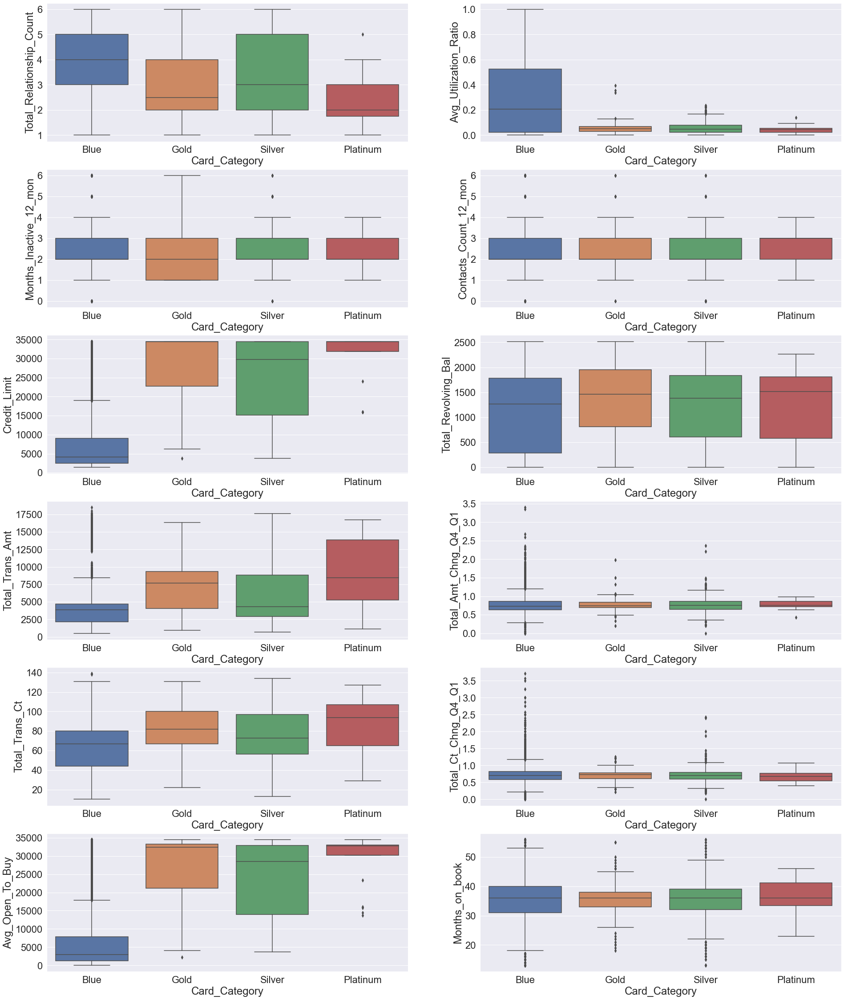

In [178]:
fig, axes = plt.subplots(nrows=6, ncols=2, figsize=(32, 40))
sns.set(font_scale=1) 
for i in range(len(behavior_features)):
    j = i // 2
    k = i % 2
    sns.boxplot(x='Card_Category', y=behavior_features[i], data=df, ax = axes[j][k])


####  Customer with Different type Cards Observations 
* Gold and Platinum card customers use less than bank products than Blue and Sliver customers. We need to improve retention of them.  One suggestion will be that we design some bank products and sell them to the Gold and Platinum card customers.
* Some of Blue card holders' ***credit limit*** and ***Avg_Open_To_Buy*** are much higher than other Blue card customers, their use behaviors are similar to Sliver card customers. One suggestion will be that recommending upgrading their Blue cards free of charge to get better service and improve their retention. 
* Gold and Platinum card customers have higher ***credit limit*** and ***Total_Trans_Ct*** than Blue card customers but have higher churn rate. Their ***Avg_Open_To_Buy*** are close to ***credit limit***, so there is no issue about it.


<a id="Feature_Engineering"></a>
<h1 style="background-color:#fbcc54;font-family:monospace;font-size:250%;text-align:center">5. Feature Engineering</h1>

<a id="target_0_1"></a>
<h3 style="color:blue">5.1 Change the target "Attrition_Flag" to 0 or 1 </h3>

In [50]:
df = pd.read_csv("BankChurners_unknown.csv")

df['class'] = df['Attrition_Flag'].map({'Attrited Customer':1, 'Existing Customer':0})
df = df.drop('Attrition_Flag', axis=1)

In [51]:
df.head()


,CLIENTNUM,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,class
0,768805383,45,M,3,High School,Married,$60K - $80K,Blue,39,5,...,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061,0
1,818770008,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,...,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105,0
2,713982108,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,...,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000,0
3,769911858,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,...,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760,0
4,709106358,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,...,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000,0


In [52]:
data = deepcopy(df)

In [53]:
categorical_cols = [
    "Gender",
    "Education_Level",
    "Marital_Status",
    "Income_Category",
    "Card_Category",
]


<a id="one_hot_encoding"></a>
<h3 style="color:blue">5.2 Change the categorical features to One hot encoding</h3>

Label encoder is used for label feature, one hot encoder is used for unordered categorical features, ordinal encoder is used for ordered categorical features. For example, ***Education_Level***, ***Income_Category***, ***Card_Category*** are ordered features, so we will use ordinal encoder. 



In [54]:
categorical_cols.remove('Gender')
data['Gender'] = data['Gender'].map({'M':1, 'F':0})

In [55]:
def encode_and_bind(original_dataframe, feature_to_encode):
    dummies = pd.get_dummies(original_dataframe[[feature_to_encode]])
    res = pd.concat([original_dataframe, dummies], axis=1)
    res = res.drop([feature_to_encode], axis=1)
    return(res) 

for feature in categorical_cols:
    data = encode_and_bind(data, feature)

In [56]:
data.head()
data.to_csv("BankChurners_unknown_onehot_data.csv", index=False)

<a id="Generate_X_y"></a>
<h3 style="color:blue">5.3 Generate X and y</h3>

In [57]:
X = data.drop(columns="class")

y = data["class"]

In [58]:
X.head()

,CLIENTNUM,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,...,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,768805383,45,1,3,39,5,1,3,12691.000,777,...,0,0,1,0,0,0,1,0,0,0
1,818770008,49,0,5,44,6,1,2,8256.000,864,...,0,0,0,0,1,0,1,0,0,0
2,713982108,51,1,3,36,4,1,0,3418.000,0,...,0,0,0,1,0,0,1,0,0,0
3,769911858,40,0,4,34,3,4,1,3313.000,2517,...,0,0,0,0,1,0,1,0,0,0
4,709106358,40,1,3,21,5,1,0,4716.000,0,...,0,0,1,0,0,0,1,0,0,0


In [59]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: class, dtype: int64

<a id="splitting_train_test"></a>
<h3 style="color:blue">5.4 Splitting the data into train/test</h3>

In [60]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=1234)

In [61]:
# Save X_train, X_test to files
X_train.to_csv("X_train_unknown_onehot.csv", index=False)
y_train.to_csv("y_train_unknown_onehot.csv", index=False)

X_test.to_csv("X_test_unknown_onehot.csv", index=False)
y_test.to_csv("y_test_unknown_onehot.csv", index=False)


In [62]:
X_train.head()

,CLIENTNUM,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,...,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
9907,714543633,45,0,3,36,1,2,5,7500.000,0,...,0,0,0,0,1,0,1,0,0,0
2396,711426033,49,1,2,39,3,2,2,11332.000,946,...,0,0,0,1,0,0,1,0,0,0
4161,709957158,48,1,4,40,5,1,2,2514.000,2251,...,0,1,0,0,0,0,1,0,0,0
9212,711826983,47,0,3,36,4,3,6,5822.000,0,...,0,1,0,0,0,0,1,0,0,0
3897,711925608,42,1,4,35,3,2,2,18274.000,1623,...,0,0,0,1,0,0,1,0,0,0


<a id="feature_selection"></a>
<h3 style="color:blue">5.5 Feature Selection</h3>

In [64]:
#ch-square to find the most important features
X_train = pd.read_csv("X_train_unknown_onehot.csv")
X_test = pd.read_csv("X_test_unknown_onehot.csv")

X_train.drop(columns=["CLIENTNUM"], inplace=True)
X_test.drop(columns=["CLIENTNUM"], inplace=True)

bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X_train,y_train)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X_train.columns)
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']
featureScores.sort_values(by='Score', ascending=False)

,Specs,Score
11,Total_Trans_Amt,593151.131
8,Total_Revolving_Bal,328397.099
7,Credit_Limit,22104.462
12,Total_Trans_Ct,9439.043
9,Avg_Open_To_Buy,4433.201
6,Contacts_Count_12_mon,174.437
4,Total_Relationship_Count,111.407
5,Months_Inactive_12_mon,80.404
14,Avg_Utilization_Ratio,70.883
13,Total_Ct_Chng_Q4_Q1,55.455


<a id='Model_Building'></a>
<h1 style="background-color:#fbcc54;font-family:monospace;font-size:250%;text-align:center">6. Model Building</h1>

<a id="model_weight"></a>
<h3 style="color:blue">6.1 Model using class weight</h3>



Training Performance:

LogisticRegression:
               precision    recall  f1-score   support

           0       0.95      0.79      0.87      6793
           1       0.43      0.79      0.56      1308

    accuracy                           0.79      8101
   macro avg       0.69      0.79      0.71      8101
weighted avg       0.87      0.79      0.82      8101

DecisionTree:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6793
           1       1.00      1.00      1.00      1308

    accuracy                           1.00      8101
   macro avg       1.00      1.00      1.00      8101
weighted avg       1.00      1.00      1.00      8101

Bagging:
               precision    recall  f1-score   support

           0       0.99      1.00      1.00      6793
           1       1.00      0.97      0.98      1308

    accuracy                           0.99      8101
   macro avg       1.00      0.98      0.99      8101
weig

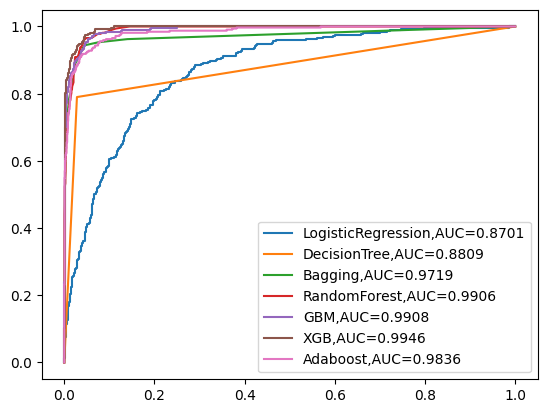

In [13]:
X_train = pd.read_csv("X_train_unknown_onehot.csv")
X_test = pd.read_csv("X_test_unknown_onehot.csv")

y_train = pd.read_csv("y_train_unknown_onehot.csv")
y_test = pd.read_csv("y_test_unknown_onehot.csv")

X_train.drop(columns=["CLIENTNUM"], inplace=True)
X_test.drop(columns=["CLIENTNUM"], inplace=True)

models = []  # Empty list to store all the models

# Appending models into the list with default parameters and random_state=1
models.append(("LogisticRegression", LogisticRegression(random_state=1234,class_weight='balanced')))
models.append(("DecisionTree", DecisionTreeClassifier(random_state=1234,class_weight='balanced')))
models.append(("Bagging", BaggingClassifier(random_state=1234)))
models.append(("RandomForest", RandomForestClassifier(random_state=1234,class_weight='balanced')))
models.append(("GBM", GradientBoostingClassifier(random_state=1234)))
models.append(("XGB",  XGBClassifier(random_state=1234)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1234)))


print("\n" "Training Performance:" "\n")

for name, model in models:
    model.fit(X_train, y_train)
    scores = classification_report(y_train, model.predict(X_train)) 
    print("{}:\n {}".format(name, scores))

print('**************************************************')    
print("\n" "Test Performance:(recall     auc)" "\n")
for name, model in models:
    y_pred =model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)
    scores = classification_report(y_test, y_pred) 
    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_proba[:, 1])  
    print("{}: \n{}\n".format(name, scores))
    auc = round(metrics.roc_auc_score(y_test, y_pred_proba[:, 1]),4)
    print("\tAUC:",auc)
    plt.plot(fpr,tpr, label=name +",AUC="+str(auc))
plt.legend()

CPU times: total: 0 ns
Wall time: 0 ns


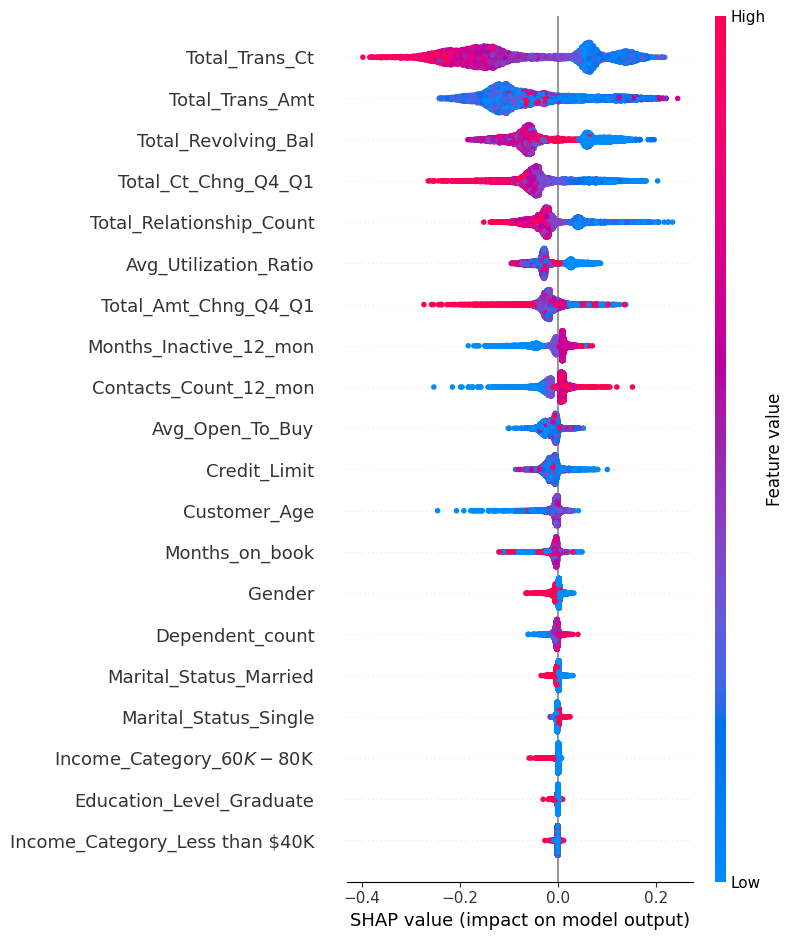

In [15]:
#shap
shap.initjs()
%time
model = models[3][1]

explainer = shap.TreeExplainer(model)

samples = X_train
shap_values = explainer.shap_values(samples, approximate=False, check_additivity=False)

shap.summary_plot(shap_values[1], samples)

<a id="SMOTE"></a>
<h3 style="color:blue">6.2 Over-Sampling(SMOTE)</h3>

In [91]:
X_train = pd.read_csv("X_train_unknown_onehot.csv")
y_train = pd.read_csv("y_train_unknown_onehot.csv")
X_train.drop(columns=["CLIENTNUM"], inplace=True)

s = SMOTE(random_state=1234)
X_train_sm, y_train_sm = s.fit_resample(X_train, y_train)

X_train_sm.to_csv("X_train_unknown_onehot_sm.csv")
y_train_sm.to_csv("y_train_unknown_onehot_sm.csv")


In [92]:
y_train['class']

0       1
1       0
2       0
3       1
4       0
       ..
8096    0
8097    0
8098    0
8099    0
8100    0
Name: class, Length: 8101, dtype: int64

In [93]:
fig = make_subplots(rows=1, cols=2, specs=[[{"type": "pie"}, {"type": "pie"}]])

fig.add_trace(
    go.Pie(labels=list(Counter(y_train['class']).keys()), values=list(Counter(y_train['class']).values()), name='Original data'),
    row=1, col=1
)

fig.add_trace(
    go.Pie(labels=list(Counter(y_train_sm['class']).keys()), values=list(Counter(y_train_sm['class']).values()), name='SMOTE data'),
    row=1, col=2
)

fig.update_traces(textposition='inside', hole=.4, hoverinfo="value+percent+name")
fig.update_layout(
    title_text="Class distribution",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Original', x=0.16, y=0.5, font_size=12, showarrow=False),
                 dict(text='SMOTE', x=0.82, y=0.5, font_size=12, showarrow=False)])
fig.show()

<a id="model_oversampled"></a>
<h3 style="color:blue">6.3 Models using oversampled data</h3>


Training Performance:

LogisticRegression:
               precision    recall  f1-score   support

           0       0.82      0.82      0.82      6793
           1       0.82      0.82      0.82      6793

    accuracy                           0.82     13586
   macro avg       0.82      0.82      0.82     13586
weighted avg       0.82      0.82      0.82     13586

DecisionTree:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6793
           1       1.00      1.00      1.00      6793

    accuracy                           1.00     13586
   macro avg       1.00      1.00      1.00     13586
weighted avg       1.00      1.00      1.00     13586

Bagging:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      6793
           1       1.00      1.00      1.00      6793

    accuracy                           1.00     13586
   macro avg       1.00      1.00      1.00     13586
weig

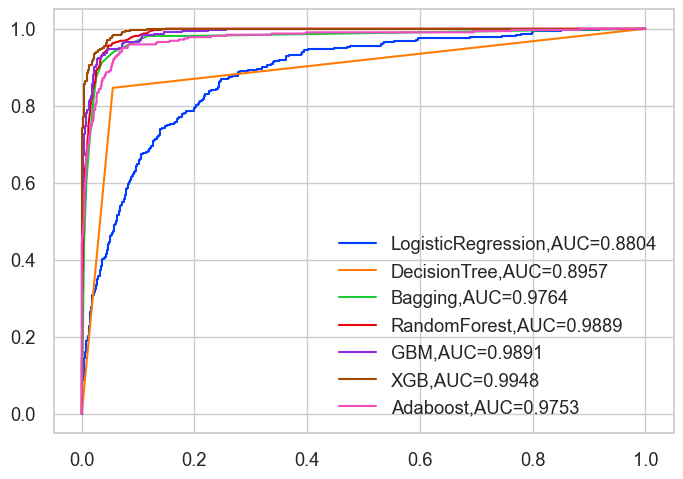

In [94]:
models = []  # Empty list to store all the models

# Appending models into the list with default parameters and random_state=1
models.append(("LogisticRegression", LogisticRegression(random_state=1234)))
models.append(("DecisionTree", DecisionTreeClassifier(random_state=1234)))
models.append(("Bagging", BaggingClassifier(random_state=1234)))
models.append(("RandomForest", RandomForestClassifier(random_state=1234)))
models.append(("GBM", GradientBoostingClassifier(random_state=1234)))
models.append(("XGB",  XGBClassifier(random_state=1234)))
models.append(("Adaboost", AdaBoostClassifier(random_state=1234)))


print("\n" "Training Performance:" "\n")

for name, model in models:
    model.fit(X_train_sm, y_train_sm)
    scores = classification_report(y_train_sm, model.predict(X_train_sm)) 
    print("{}:\n {}".format(name, scores))

print('**************************************************')    
print("\n" "Test Performance:(recall     auc)" "\n")
for name, model in models:
    y_pred =model.predict(X_test)
    y_pred_proba = model.predict_proba(X_test)
    scores = classification_report(y_test, y_pred) 
    fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred_proba[:, 1])  
    print("{}: \n{}\n".format(name, scores))
    auc = round(metrics.roc_auc_score(y_test, y_pred_proba[:, 1]),4)
    print("\tAUC:",auc)
    plt.plot(fpr,tpr, label=name +",AUC="+str(auc))
plt.legend()

CPU times: total: 0 ns
Wall time: 0 ns


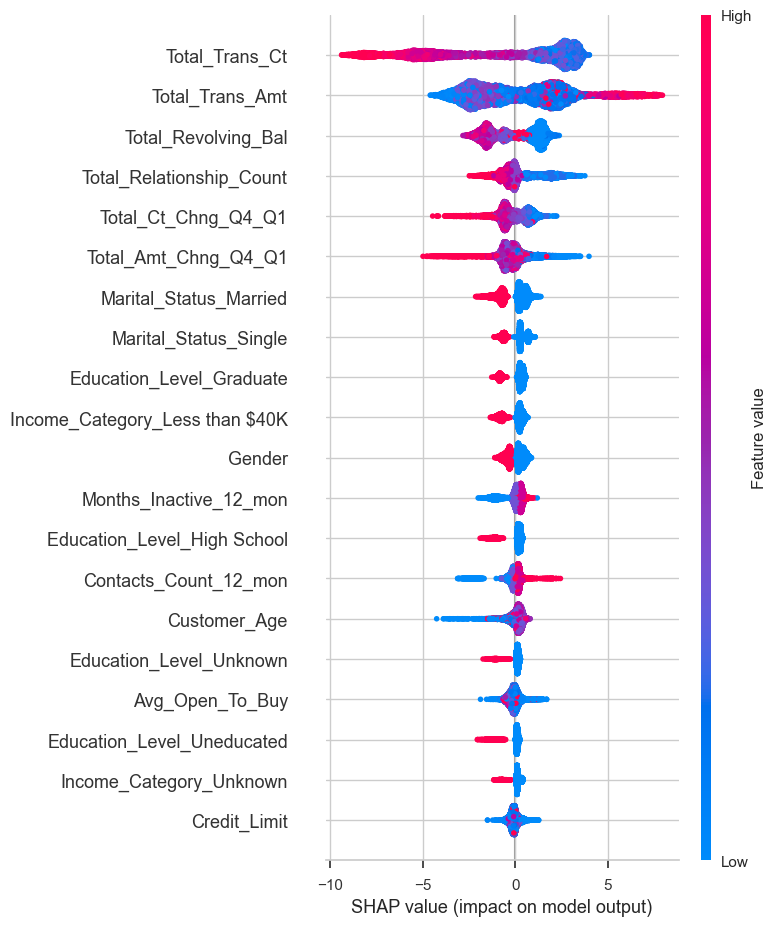

In [108]:

shap.initjs()
%time
#XGB
model = models[5][1]

explainer = shap.TreeExplainer(model)



samples = X_train_sm
shap_values = explainer.shap_values(samples, approximate=False, check_additivity=False)

shap.summary_plot(shap_values, samples)

In [119]:

#get Shap values from preprocessed data
#XGB
shap.force_plot(explainer.expected_value, shap_values[0,:],samples.iloc[0,:])


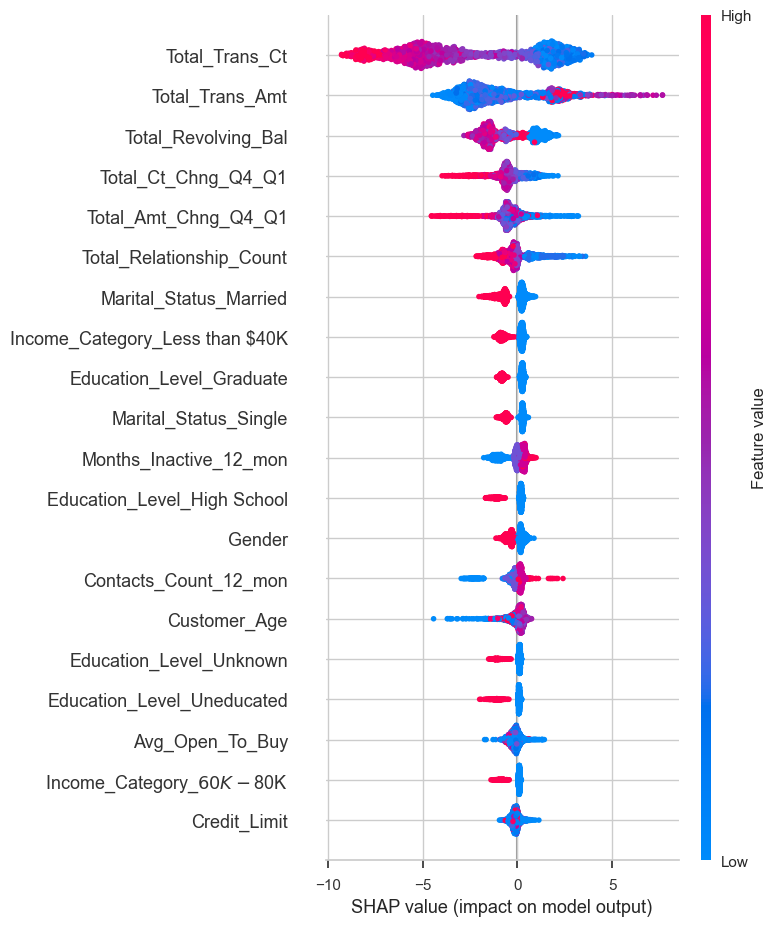

In [123]:
model = models[5][1]

explainer = shap.TreeExplainer(model)



samples = X_test
shap_values = explainer.shap_values(samples, approximate=False, check_additivity=False)

shap.summary_plot(shap_values, samples)

In [124]:
shap.force_plot(explainer.expected_value, shap_values[0,:],samples.iloc[0,:])

In [122]:
X_test.iloc[0,:]

Customer_Age                       46.000
Gender                              0.000
Dependent_count                     3.000
Months_on_book                     41.000
Total_Relationship_Count            3.000
Months_Inactive_12_mon              2.000
Contacts_Count_12_mon               2.000
Credit_Limit                     1937.000
Total_Revolving_Bal               916.000
Avg_Open_To_Buy                  1021.000
Total_Amt_Chng_Q4_Q1                0.807
Total_Trans_Amt                  4303.000
Total_Trans_Ct                     89.000
Total_Ct_Chng_Q4_Q1                 0.780
Avg_Utilization_Ratio               0.473
Education_Level_College             0.000
Education_Level_Doctorate           0.000
Education_Level_Graduate            0.000
Education_Level_High School         0.000
Education_Level_Post-Graduate       0.000
Education_Level_Uneducated          0.000
Education_Level_Unknown             1.000
Marital_Status_Divorced             0.000
Marital_Status_Married            

In [100]:
X_train.to_csv("df.csv", index=False)
pickle.dump(model,open('model.pkl','wb'))

<a id="tensorflow"></a>
<h3 style="color:blue">6.4 Neural Network with Tensorflow</h3>

In [3]:
df = pd.read_csv("BankChurners_unknown.csv")
df=df.drop('CLIENTNUM',axis=1)  

df['Gender'].replace('M',1,inplace = True)
df['Gender'].replace('F',0,inplace = True)
 
df['Education_Level'].replace('Unknown',0,inplace = True)
df['Education_Level'].replace('Uneducated',1,inplace = True)
df['Education_Level'].replace('High School',2,inplace = True)
df['Education_Level'].replace('College',3,inplace = True)
df['Education_Level'].replace('Graduate',4,inplace = True)
df['Education_Level'].replace('Post-Graduate',5,inplace = True)
df['Education_Level'].replace('Doctorate',6,inplace = True)

df['Marital_Status'].replace('Unknown',0,inplace = True)
df['Marital_Status'].replace('Single',1,inplace = True)
df['Marital_Status'].replace('Married',2,inplace = True)
df['Marital_Status'].replace('Divorced',3,inplace = True)

df['Card_Category'].replace('Blue',0,inplace = True)
df['Card_Category'].replace('Gold',1,inplace = True)
df['Card_Category'].replace('Silver',2,inplace = True)
df['Card_Category'].replace('Platinum',3,inplace = True)


df['Income_Category'].replace('Unknown',0,inplace = True)
df['Income_Category'].replace('Less than $40K',1,inplace = True)
df['Income_Category'].replace('$40K - $60K',2,inplace = True)
df['Income_Category'].replace('$60K - $80K',3,inplace = True)
df['Income_Category'].replace('$80K - $120K',4,inplace = True)
df['Income_Category'].replace('$120K +',5,inplace = True)

df['Attrition_Flag'].replace('Existing Customer',0,inplace = True)
df['Attrition_Flag'].replace('Attrited Customer',1,inplace = True)


Epoch 1/80
222/222 [==============================] - 4s 6ms/step - loss: 0.1325 - binary_accuracy: 0.4533
Epoch 2/80
222/222 [==============================] - 1s 5ms/step - loss: 0.0788 - binary_accuracy: 0.7836
Epoch 3/80
222/222 [==============================] - 1s 5ms/step - loss: 0.0746 - binary_accuracy: 0.8224
Epoch 4/80
222/222 [==============================] - 1s 5ms/step - loss: 0.0708 - binary_accuracy: 0.8245
Epoch 5/80
222/222 [==============================] - 1s 5ms/step - loss: 0.0702 - binary_accuracy: 0.8297
Epoch 6/80
222/222 [==============================] - 1s 6ms/step - loss: 0.0694 - binary_accuracy: 0.8358
Epoch 7/80
222/222 [==============================] - 1s 6ms/step - loss: 0.0691 - binary_accuracy: 0.8373
Epoch 8/80
222/222 [==============================] - 1s 6ms/step - loss: 0.0676 - binary_accuracy: 0.8473
Epoch 9/80
222/222 [==============================] - 1s 6ms/step - loss: 0.0630 - binary_accuracy: 0.8483
Epoch 10/80
222/222 [================

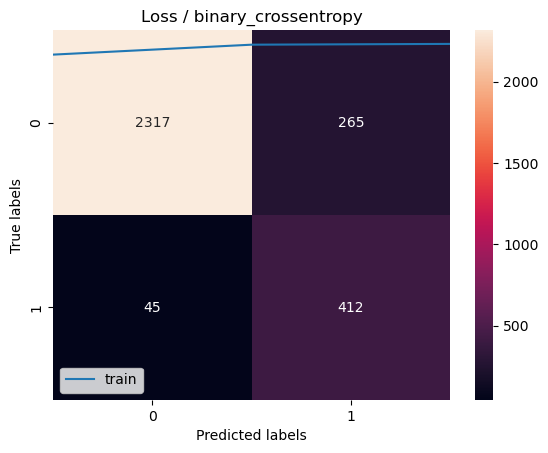

In [9]:
X = df[df.columns[1:20]]
y = df[df.columns[0]]

rs = RobustScaler()
X =rs.fit_transform(X)

a = y.value_counts()
ratio = a[1]/(a[1]+a[0])
weights = [ratio, 1-ratio]

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3, random_state=103)

cw = class_weight.compute_class_weight(class_weight ='balanced', classes=np.unique(y_train), y=y_train)

model = Sequential()
model.add(Dense(19,activation="sigmoid"))
model.add(Dense(10,activation="sigmoid"))
model.add(Dense(1))
model.compile(optimizer='rmsprop',loss = "binary_crossentropy",metrics=["BinaryAccuracy"],loss_weights=weights)

history = model.fit(x=X_train,y=y_train,epochs=80, class_weight = {0:cw[0], 1:cw[1]})

y_pred = model.predict_classes(X_test)    

#%%

cm = confusion_matrix(y_test, y_pred)
   
print('\n')
print('Neural Network Accuracy: ', accuracy_score(y_test,y_pred))
print('Neural Network Recall score: ', recall_score(y_test,y_pred))

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax, fmt='g')
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Neural Network Confusion Matrix')



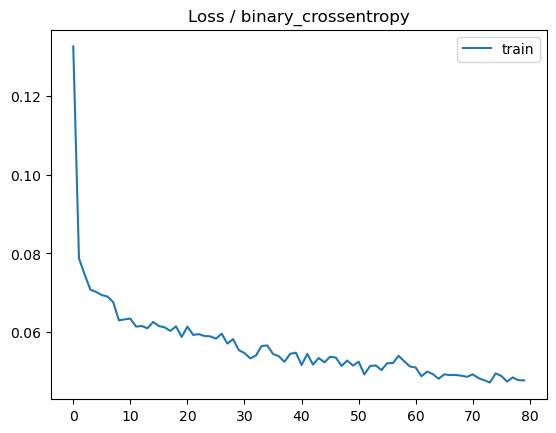

In [10]:
plt.title('Loss / binary_crossentropy')
plt.plot(history.history['loss'], label='train')
plt.legend()
plt.show()

In [7]:
y

0        0
1        0
2        0
3        0
4        0
        ..
10122    0
10123    1
10124    1
10125    1
10126    1
Name: Attrition_Flag, Length: 10127, dtype: int64

<a id="Customer_Segmentation"></a>
<h1 style="background-color:#fbcc54;font-family:monospace;font-size:250%;text-align:center">7. Customer Segmentation</h1>


There are 4 types of market segmentation: 
1. Demographic Segmentation
2. Behavioral Segmentation
3. Geographic Segmentation
4. Psychographic Segmentation

In our case:

Summary of types of features in the dataset and their contribution to churn:

|Feature|Group:|Data Type|Churn Contribution|
|:------------------------:|:--------:|:--------:|:---------------------------:|
|Gender                  |Demographic|Cat |No|
|Marital_Status          |Demographic|Cat |No|
|Educational_Level       |Demographic|Cat |No|
|Income_Category         |Demographic|Cat |No|
|Customer_Age            |Demographic|Num |No|
|Dependent_count         |Demographic|Num |No|
|Card_Category           |Behavioral |Cat |No|
|Months_on_book          |Behavioral |Num |No|
|Months_Inactive_12_mon  |Behavioral |Num |No|
|Contacts_Count_12_mon   |Behavioral |Num |No|
|Total_Relationship_Count|Behavioral |Num |Yes|
|Credit_Limit            |Behavioral |Num |Yes|
|Avg_Open_To_Buy         |Behavioral |Num |Yes|
|Total_Trans_Ct          |Behavioral |Num |Yes|
|Total_Trans_Amt         |Behavioral |Num |Yes|
|Avg_Utilization_Ratio   |Behavioral |Num |Yes|
|Total_Revolving_Bal     |Behavioral |Num |Yes|
|Total_Ct_Chng_Q4_Q1     |Behavioral |Num |Yes|
|Total_Amt_Chng_Q4_Q1    |Behavioral |Num |Yes|


#### Observation:
* There are two groups of features: Demographic (6) and Behavioral features (13). Demographic features: Most are categorical features. All features contribute little to churn decisions. Behavioral features: Most are numerical features. The only categorical feature is card type, which also contribute very little to churning since there is one dominant type-blue card. Most numerical features in this group contribute to churn decisions.


<a id="Demographic"></a>
<h3 style="color:blue">7.1 Demographic Segmentation</h3>

Our strategy for Demographic segmentation: 
* We will use KModes clustering algorithm to cluster customers based on demographic information since most features in the group are categorical. We will bin Customer_Age to 6 groups and change Dependent_count column to categorical column.
* Use elbow curve to find optimal K value.
* Examine distribution of churners in each cluster. Hope to enrich churner in certain cluster(s) for marketing strategies design based on cluster charaterization.


In [70]:
segment_data = pd.read_csv("BankChurners_unknown.csv")

demographic_feature = [
    "Gender",
    "Education_Level",
    "Marital_Status",
    "Income_Category",
    "Card_Category",
    "Customer_Age",
    "Dependent_count"
]

demographic_categorical_feature = [
    "Gender",
    "Education_Level",
    "Marital_Status",
    "Income_Category",
    "Card_Category"
]

segment_demographic = pd.DataFrame()
segment_demographic[demographic_feature] = segment_data[demographic_feature]


scaled_X = StandardScaler().fit_transform(segment_demographic[['Dependent_count', 'Customer_Age']])
segment_demographic[['Dependent_count', 'Customer_Age']] = scaled_X


In [71]:
segment_demographic

,Gender,Education_Level,Marital_Status,Income_Category,Card_Category,Customer_Age,Dependent_count
0,M,High School,Married,$60K - $80K,Blue,-0.165,0.503
1,F,Graduate,Single,Less than $40K,Blue,0.334,2.043
2,M,Graduate,Married,$80K - $120K,Blue,0.583,0.503
3,F,High School,Unknown,Less than $40K,Blue,-0.789,1.273
4,M,Uneducated,Married,$60K - $80K,Blue,-0.789,0.503
...,...,...,...,...,...,...,...
10122,M,Graduate,Single,$40K - $60K,Blue,0.458,-0.267
10123,M,Unknown,Divorced,$40K - $60K,Blue,-0.664,-0.267
10124,F,High School,Married,Less than $40K,Blue,-0.290,-1.036
10125,M,Graduate,Unknown,$40K - $60K,Blue,-2.037,-0.267


In [81]:
categorical_index = list(range(0,5))
categorical_index

[0, 1, 2, 3, 4]

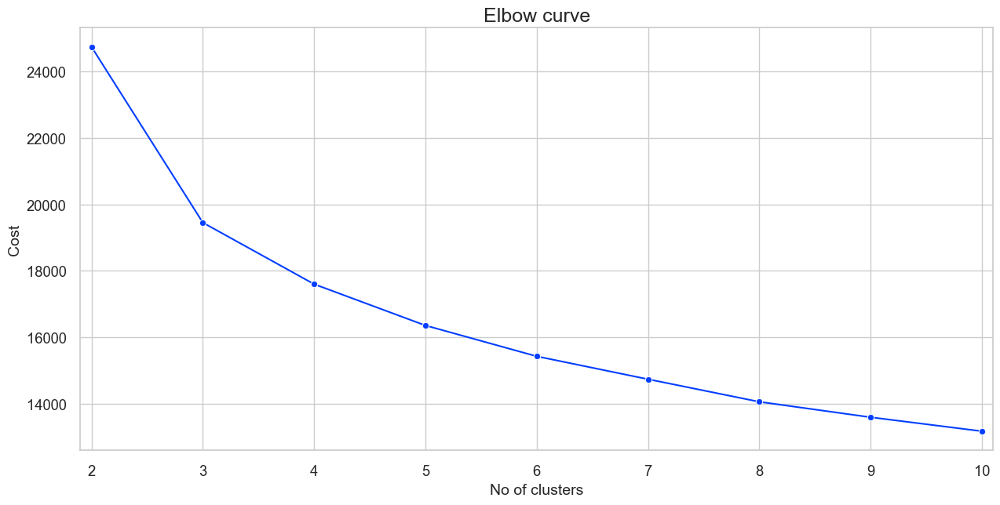

In [82]:
# Function for plotting elbow curve
def plot_elbow_curve(start, end, data):
    no_of_clusters = list(range(start, end+1))
    cost_values = []
    
    for k in no_of_clusters:
        test_model = KPrototypes(n_clusters=k, init='Huang', random_state=42, n_jobs=-1)
        test_model.fit_predict(data, categorical=categorical_index)
        cost_values.append(test_model.cost_)
        
    sns.set_theme(style="whitegrid", palette="bright", font_scale=1.2)
    
    plt.figure(figsize=(15, 7))
    ax = sns.lineplot(x=no_of_clusters, y=cost_values, marker="o", dashes=False)
    ax.set_title('Elbow curve', fontsize=18)
    ax.set_xlabel('No of clusters', fontsize=14)
    ax.set_ylabel('Cost', fontsize=14)
    ax.set(xlim=(start-0.1, end+0.1))
    plt.plot();

# Plotting elbow curve for k=2 to k=10
plot_elbow_curve(2,10,segment_demographic)

In [84]:
#cluster = 4

model4 = KPrototypes(n_clusters=4, init='Huang', random_state=42, n_jobs=-1)
model4.fit_predict(segment_demographic, categorical=categorical_index)
#new column for cluster labels associated with each subject
segment_data['customer_group'] = model4.labels_

In [86]:
segment_data['customer_group'].value_counts()

2    3239
1    2605
3    2521
0    1762
Name: customer_group, dtype: int64

<AxesSubplot: title={'center': 'Group 4'}, ylabel='Attrition_Flag'>

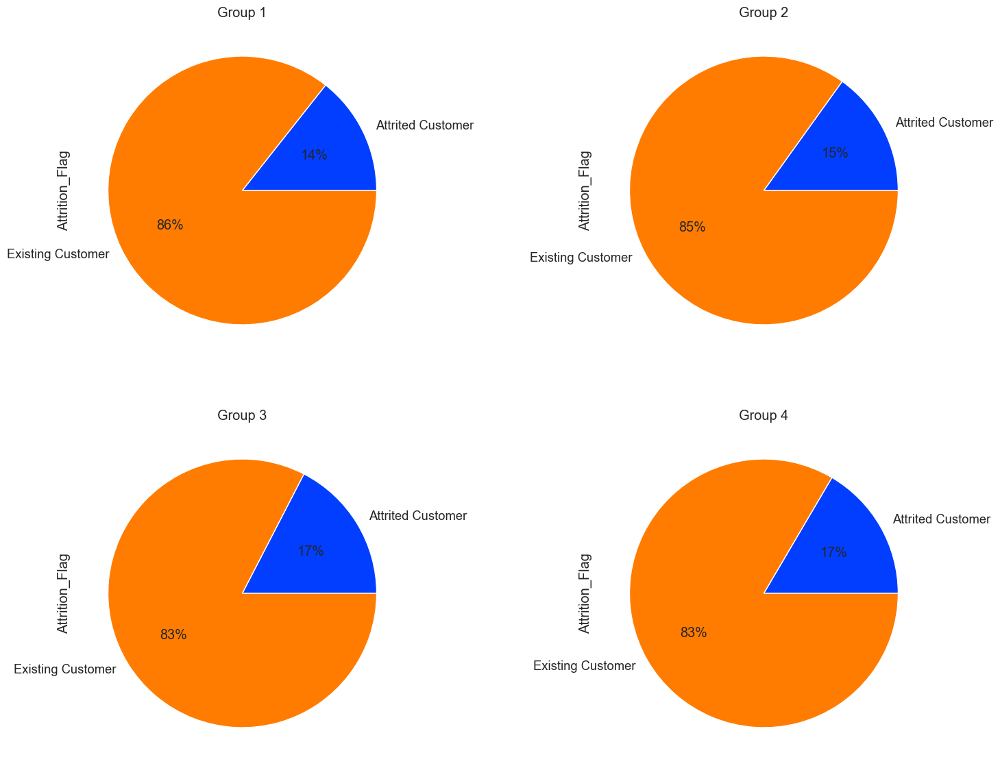

In [89]:
fig, axs = plt.subplots(ncols=2,nrows=2, figsize=(18,14))

segment_data[segment_data['customer_group'] == 0]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[0,0], title='Group 1',autopct='%1.0f%%')
segment_data[segment_data['customer_group'] == 1]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[0,1], title='Group 2',autopct='%1.0f%%')
segment_data[segment_data['customer_group'] == 2]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[1,0], title='Group 3',autopct='%1.0f%%')
segment_data[segment_data['customer_group'] == 3]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[1,1], title='Group 4',autopct='%1.0f%%')


<a id="Behavior"></a>
<h3 style="color:blue">7.2 Behavior Segmentation</h3>

Our strategy for Behavior segmentation: 

* Customer segmentation on Behavioral information: We will use Kmeans clustering algorithm to cluster customers based on behavioral information since most features in the group are numerical. We will use orderial encoding to transform column Card_type or just eliminate it from the analysis since blue card customers dominate the group and hence not likely to contribute much to clustering.

In [36]:
segment = pd.read_csv("BankChurners_unknown.csv")

behavior_feature = [
    "Card_Category",
    "Months_on_book",
    "Total_Relationship_Count",
    "Months_Inactive_12_mon",
    "Contacts_Count_12_mon",
    "Credit_Limit",
    "Total_Revolving_Bal",
    "Avg_Open_To_Buy",
    "Total_Amt_Chng_Q4_Q1",
    "Total_Trans_Amt",
    "Total_Trans_Ct",
    "Total_Ct_Chng_Q4_Q1",
    "Avg_Utilization_Ratio",
]

segment_behavior = pd.DataFrame()
segment_behavior[behavior_feature] = segment[behavior_feature]
segment_behavior['Card_Category']
segment_behavior['Card_Category'].replace('Blue',0,inplace = True)
segment_behavior['Card_Category'].replace('Gold',1,inplace = True)
segment_behavior['Card_Category'].replace('Silver',2,inplace = True)
segment_behavior['Card_Category'].replace('Platinum',3,inplace = True)

In [37]:
segment_behavior

,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,0,39,5,1,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061
1,0,44,6,1,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105
2,0,36,4,1,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000
3,0,34,3,4,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760
4,0,21,5,1,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,0,40,3,2,3,4003.000,1851,2152.000,0.703,15476,117,0.857,0.462
10123,0,25,4,2,3,4277.000,2186,2091.000,0.804,8764,69,0.683,0.511
10124,0,36,5,3,4,5409.000,0,5409.000,0.819,10291,60,0.818,0.000
10125,0,36,4,3,3,5281.000,0,5281.000,0.535,8395,62,0.722,0.000


#### Using Kmeans Clustering
When using KMeans, we have to specify the number of clusters. One way to find the ideal number of clusters is the elbow method.

The elbow method allows us to identify at which K value the sum of squared distance, or the distance between data points and their respective centroids, begins to level off.

The sum of squared distance flattening indicates that increasing the amount of clusters is not leading to better-defined clusters, so it is a good method to use when trying to find an optimal value for K.

Let's use the elbow method to select our value for K.



In [38]:
sd = StandardScaler()
segment_behavior_scale = sd.fit_transform(segment_behavior)

segment_behavior_scale

array([[-2.63461892e-01,  3.84620878e-01,  7.63942609e-01, ...,
        -9.73895182e-01,  3.83400260e+00, -7.75882235e-01],
       [-2.63461892e-01,  1.01071482e+00,  1.40730617e+00, ...,
        -1.35734038e+00,  1.26085729e+01, -6.16275655e-01],
       [-2.63461892e-01,  8.96451285e-03,  1.20579050e-01, ...,
        -1.91120566e+00,  6.80786367e+00, -9.97154993e-01],
       ...,
       [-2.63461892e-01,  8.96451285e-03,  7.63942609e-01, ...,
        -2.07004789e-01,  4.44305026e-01, -9.97154993e-01],
       [-2.63461892e-01,  8.96451285e-03,  1.20579050e-01, ...,
        -1.21794745e-01,  4.10696270e-02, -9.97154993e-01],
       [ 3.88596047e+00, -1.36844216e+00,  1.40730617e+00, ...,
        -1.64399767e-01, -2.65557291e-01, -3.11572183e-01]])

In [47]:
score = []
inertia = []

for n_clusters in range(2,10):
    kmeans = KMeans(n_clusters=n_clusters, init = 'k-means++', max_iter = 500,n_init=10, random_state=42)
    kmeans.fit(segment_behavior_scale)
    inertia.append(kmeans.inertia_)
    score.append(silhouette_score(segment_behavior_scale, kmeans.labels_,sample_size=128, metric='euclidean'))

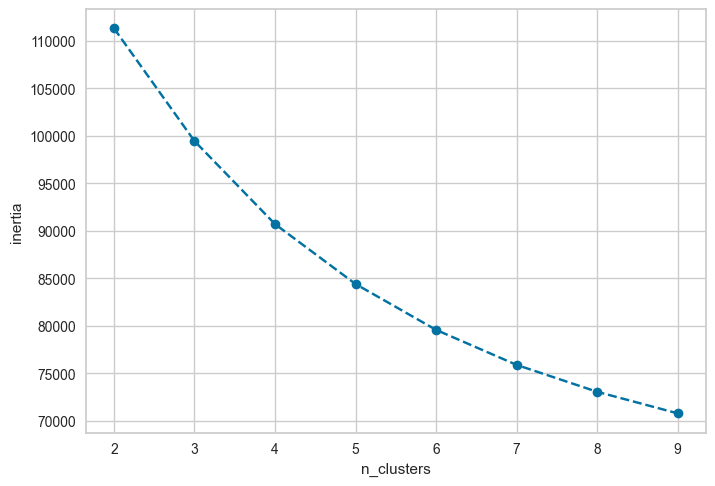

In [48]:
n_clusters = range(2, 10)
plt.plot(n_clusters, inertia, "bo--")
plt.xlabel("n_clusters")
plt.ylabel("inertia")
plt.show()

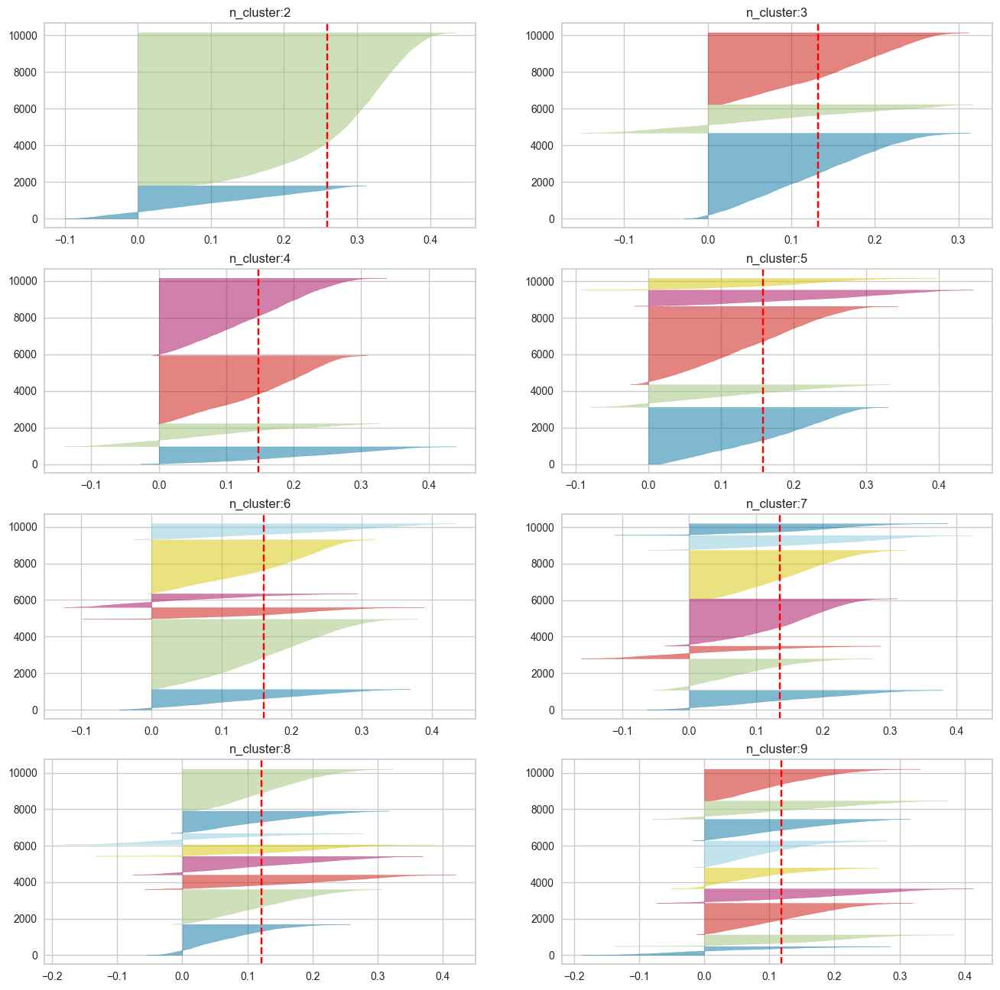

In [53]:
fig, ax = plt.subplots(4, 2, figsize=(16,16))
for i in range(2,10):
    #Create KMeans instance for different number of clusters
    km = KMeans(n_clusters=i,init='k-means++',n_init=10,max_iter=500,random_state=42)
    q, mod = divmod(i, 2)
   
    #Create SilhouetteVisualizer instance with KMeans instance. Fit the visualizer
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', title="My custom title", ax=ax[q-1][mod])
    ax[q-1][mod].set_title('n_cluster:'+str(i))
    visualizer.fit(segment_behavior_scale)

In [54]:
# cluster 8
clusterer = KMeans(n_clusters=8, init='k-means++',n_init=10,max_iter=500, random_state=42)
cluster_labels = clusterer.fit_predict(segment_behavior_scale)

segment['customer_group'] = cluster_labels
segment.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,customer_group
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,3,12691.000,777,11914.000,1.335,1144,42,1.625,0.061,5
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,2,8256.000,864,7392.000,1.541,1291,33,3.714,0.105,5
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,0,3418.000,0,3418.000,2.594,1887,20,2.333,0.000,5
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,1,3313.000,2517,796.000,1.405,1171,20,2.333,0.760,5
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,0,4716.000,0,4716.000,2.175,816,28,2.500,0.000,5


In [55]:
segment['customer_group'].value_counts()

7    2288
1    1901
0    1688
6    1213
3    1008
2     790
4     629
5     610
Name: customer_group, dtype: int64

<AxesSubplot: title={'center': 'Segment 7'}, ylabel='Attrition_Flag'>

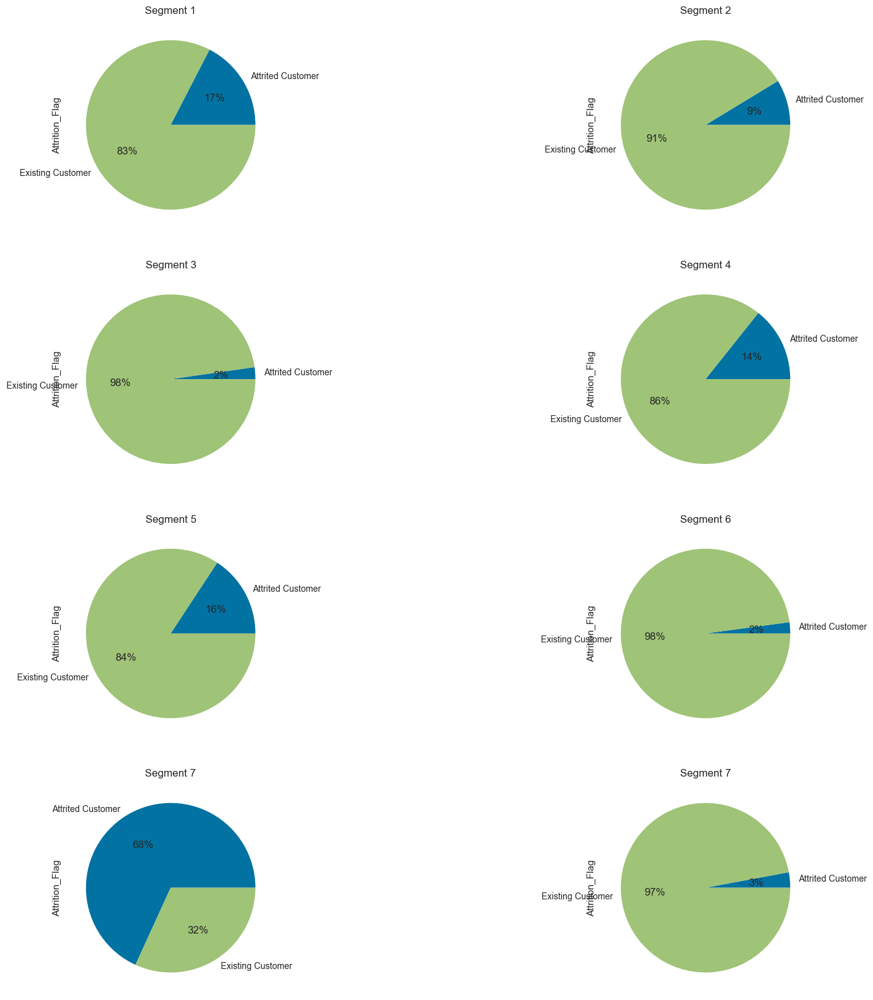

In [56]:
fig, axs = plt.subplots(ncols=2,nrows=4, figsize=(20,20))

segment[segment['customer_group'] == 0]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[0,0], title='Segment 1',autopct='%1.0f%%')
segment[segment['customer_group'] == 1]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[0,1], title='Segment 2',autopct='%1.0f%%')
segment[segment['customer_group'] == 2]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[1,0], title='Segment 3',autopct='%1.0f%%')
segment[segment['customer_group'] == 3]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[1,1], title='Segment 4',autopct='%1.0f%%')
segment[segment['customer_group'] == 4]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[2,0], title='Segment 5',autopct='%1.0f%%')
segment[segment['customer_group'] == 5]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[2,1], title='Segment 6',autopct='%1.0f%%')
segment[segment['customer_group'] == 6]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[3,0], title='Segment 7',autopct='%1.0f%%')
segment[segment['customer_group'] == 7]['Attrition_Flag'].value_counts().sort_index().plot.pie(ax=axs[3,1], title='Segment 7',autopct='%1.0f%%')


<AxesSubplot: title={'center': 'Segment 8'}>

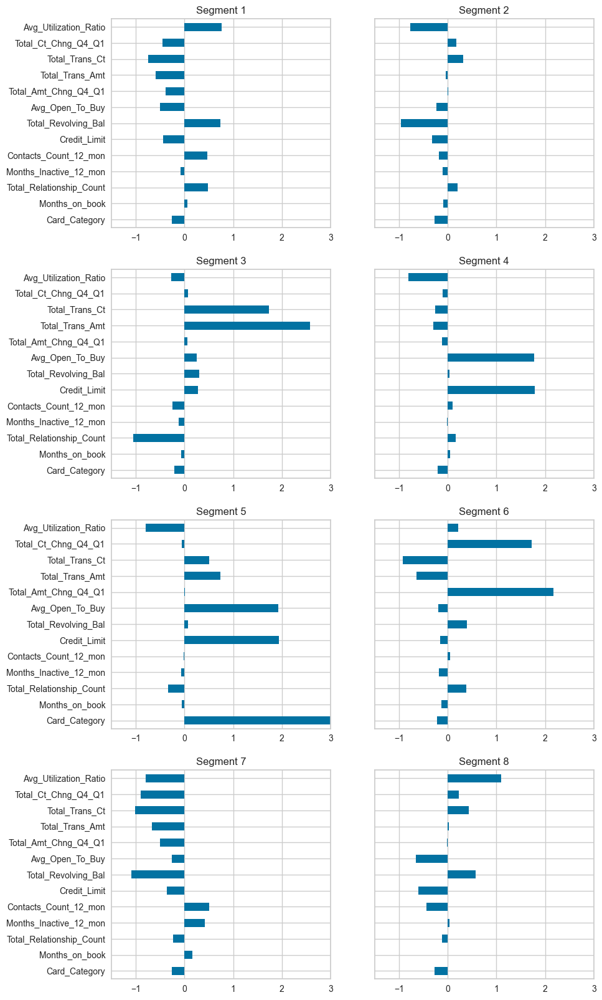

In [66]:
segment_behavior_data = pd.DataFrame(segment_behavior_scale, columns=behavior_feature)
#segment_behavior_data[behavior_feature] = segment_behavior_scale[behavior_feature]

segment_behavior_data['customer_group'] = segment['customer_group']
fix, axs = plt.subplots(ncols=2,nrows=4, figsize=(20,32))

segment_behavior_data[segment_behavior_data['customer_group'] == 0][behavior_feature].mean().plot.barh(ax=axs[0,0], xlim=(-1.5, 3), figsize=(10,20), sharey=True, title='Segment 1')
segment_behavior_data[segment_behavior_data['customer_group'] == 1][behavior_feature].mean().plot.barh(ax=axs[0,1], xlim=(-1.5, 3), figsize=(10,20), sharey=True, title='Segment 2')
segment_behavior_data[segment_behavior_data['customer_group'] == 2][behavior_feature].mean().plot.barh(ax=axs[1,0], xlim=(-1.5, 3), figsize=(10,20), sharey=True, title='Segment 3')
segment_behavior_data[segment_behavior_data['customer_group'] == 3][behavior_feature].mean().plot.barh(ax=axs[1,1], xlim=(-1.5, 3), figsize=(10,20), sharey=True, title='Segment 4')
segment_behavior_data[segment_behavior_data['customer_group'] == 4][behavior_feature].mean().plot.barh(ax=axs[2,0], xlim=(-1.5, 3), figsize=(10,20), sharey=True, title='Segment 5')
segment_behavior_data[segment_behavior_data['customer_group'] == 5][behavior_feature].mean().plot.barh(ax=axs[2,1], xlim=(-1.5, 3), figsize=(10,20), sharey=True, title='Segment 6')
segment_behavior_data[segment_behavior_data['customer_group'] == 6][behavior_feature].mean().plot.barh(ax=axs[3,0], xlim=(-1.5, 3), figsize=(10,20), sharey=True, title='Segment 7')
segment_behavior_data[segment_behavior_data['customer_group'] == 7][behavior_feature].mean().plot.barh(ax=axs[3,1], xlim=(-1.5, 3), figsize=(10,20), sharey=True, title='Segment 8')

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 10127 samples in 0.052s...
[t-SNE] Computed neighbors for 10127 samples in 2.601s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10127
[t-SNE] Computed conditional probabilities for sample 2000 / 10127
[t-SNE] Computed conditional probabilities for sample 3000 / 10127
[t-SNE] Computed conditional probabilities for sample 4000 / 10127
[t-SNE] Computed conditional probabilities for sample 5000 / 10127
[t-SNE] Computed conditional probabilities for sample 6000 / 10127
[t-SNE] Computed conditional probabilities for sample 7000 / 10127
[t-SNE] Computed conditional probabilities for sample 8000 / 10127
[t-SNE] Computed conditional probabilities for sample 9000 / 10127
[t-SNE] Computed conditional probabilities for sample 10000 / 10127
[t-SNE] Computed conditional probabilities for sample 10127 / 10127
[t-SNE] Mean sigma: 0.827514
[t-SNE] KL divergence after 250 iterations with early exaggeration: 88.616562
[t-SNE] KL

<AxesSubplot: xlabel='tsne-2d-one', ylabel='tsne-2d-two'>

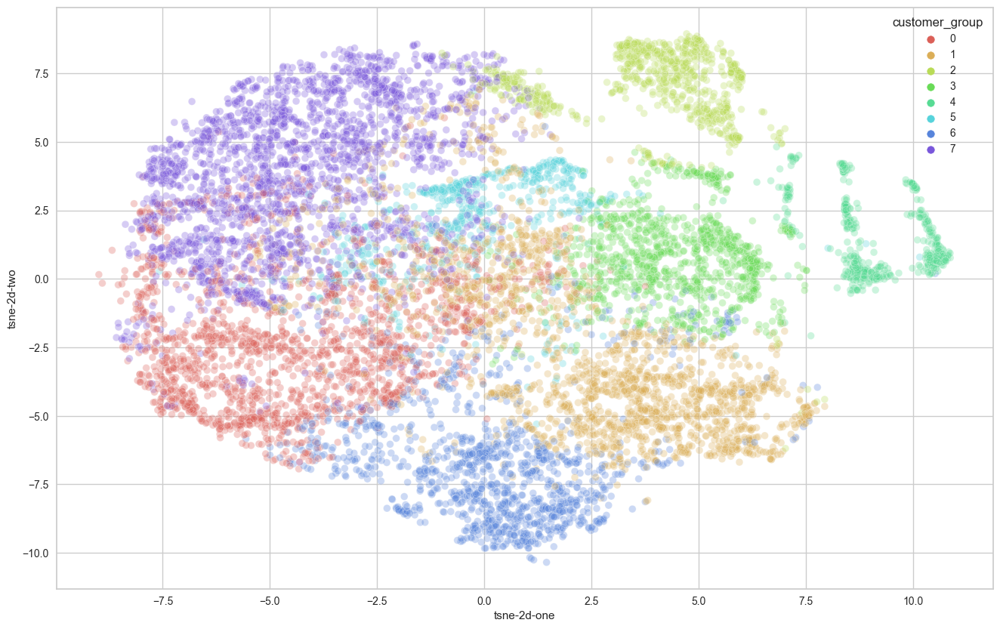

In [69]:

tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(segment_behavior_scale)

segment_behavior_data['tsne-2d-one'] = tsne_results[:,0]
segment_behavior_data['tsne-2d-two'] = tsne_results[:,1]

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue="customer_group",
    palette=sns.color_palette("hls", 10),
    data=segment_behavior_data,
    legend="full",
    alpha=0.3
)

<a id='Deploy'></a>
<h1 style="background-color:#fbcc54;font-family:monospace;font-size:250%;text-align:center">8. Deploy</h1>

In [ ]:
# save the model by pickle



<a id='Conclusion'></a>
<h1 style="background-color:#fbcc54;font-family:monospace;font-size:250%;text-align:center">9. Conclusion</h1>